In [32]:
import pandas as pd 
import numpy as np
import seaborn as sns
import os 
import matplotlib.pyplot as plt
import matplotlib
from matplotlib.colors import LogNorm
matplotlib.rcParams.update({"font.size":12})

from EEM import RE_A,RMSE,ABS,_preprocess_data


In [33]:
# Chargement des fichiers
Ref = pd.read_csv("Processing_Detailed.csv")
A = pd.read_csv("Processing_Reduced.csv")
B = pd.read_csv("Processing_OptimB.csv")



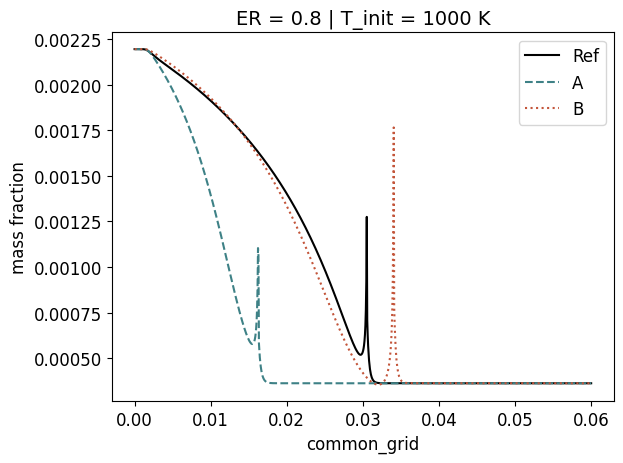

In [35]:
Phi_init = [0.8]
T_init = [1000]
sp = "Y_H2"
for ER in Phi_init:
    for T in T_init:
        loc_ref = Ref[(Ref["Phi_Init"] == ER) & (Ref["T_Init"] == T)]
        loc_A = A[(A["Phi_Init"] == ER) & (A["T_Init"] == T)]
        loc_B = B[(B["Phi_Init"] == ER) & (B["T_Init"] == T)]
        plt.figure()
        plt.plot(loc_ref["common_grid"], loc_ref[sp],color="k", label="Ref")
        plt.plot(loc_A["common_grid"], loc_A[sp], linestyle='--',color = "#3e8186", label="A")
        plt.plot(loc_B["common_grid"], loc_B[sp], linestyle=':', color ="#c3553a",label=f"B")


        plt.xlabel("common_grid")
        plt.ylabel("mass fraction")
        plt.title(f"ER = {ER} | T_init = {T} K", fontsize=14)
        plt.tight_layout()
        plt.legend()
        name =f"ER_{ER}_T_{T}.png"
        # plt.savefig(f"A_vs_B/{name}")
        plt.show()


In [36]:

input_fitness = ['Y_NH3', 'Y_H2', 'Y_O2', 'Y_H2O', 'Y_NO', 'Y_NO2', 'Y_N2O',  'Y_NNH', 'Y_HNO',"Y_N2"]
transformations = {
    "mm":        {"do_log": None, "norm_type": "minmax"},
    "log_mm":    {"do_log": True,  "norm_type": "minmax"},
    "std" :      {"do_log": None,  "norm_type": "standard"},
    "log_std" :  {"do_log": True,  "norm_type": "standard"}, 
    "log" :      {"do_log" : True, "norm_type" : None}, 
    "raw" :      {"do_log": False, "norm_type" : None}
}

In [37]:
# Fonction pour créer les labels LaTeX
def make_label(err_name, do_log=False, norm_type=None):
    norm_map = {"standard": "std", "minmax": "mm"}
    norm_suffix = norm_map.get(norm_type, None)

    if do_log and norm_suffix:
        label = fr"$\widehat{{{err_name}}}^{{{norm_suffix}}}$"
    elif do_log and not norm_suffix:
        label = fr"$\widehat{{{err_name}}}$"
    elif not do_log and norm_suffix:
        label = fr"${err_name}^{{{norm_suffix}}}$"
    else:
        label = err_name
    return label

In [38]:
# Combinaisons ciblées à comparer : (fonction, transformation)
# F = RMSE
comparisons = [
    (ABS, "mm"),
    (ABS, "log_mm"),
    (RE_A, "log_mm"),
    
]

# Calcul des ratios
Ratio = {}
for F_obj, trans_name in comparisons:
    do_log = transformations[trans_name]["do_log"]
    norm_type = transformations[trans_name]["norm_type"]
    
    Err_A = F_obj(Ref, A, input_fitness, True, do_log, norm_type)
    Err_B = F_obj(Ref, B, input_fitness, True, do_log, norm_type)
    
    label = make_label(F_obj.__name__, do_log, norm_type)
    Ratio[label] = Err_A[input_fitness].sum(axis=0) / Err_B[input_fitness].sum(axis=0)

# Transformer en DataFrame
Ratio_df = pd.DataFrame(Ratio).T

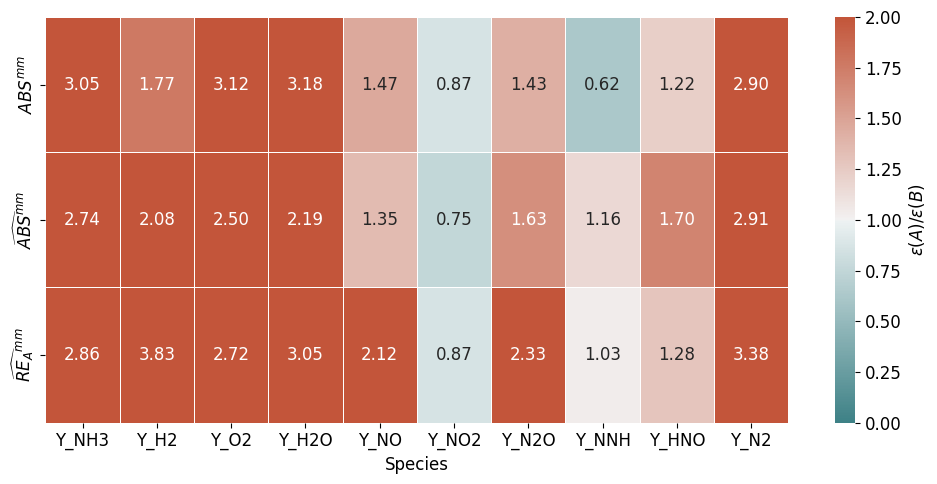

In [39]:

plt.figure(figsize=(10,5))
# Heatmap centrée sur 1
ax = sns.heatmap(Ratio_df,
                 annot=True,
                 fmt=".2f",
                 center=1,  # centre le colormap sur 1
                 vmin=0,
                 vmax=2,
                 cmap=sns.diverging_palette(200, 20, center="light", as_cmap=True),
                 linewidths=0.5)

# Barre de couleur
cbar = ax.collections[0].colorbar
cbar.set_label(r"$\epsilon(A)/\epsilon(B)$")

plt.tight_layout()
plt.savefig("AvsB.png")
plt.show()


In [27]:
Ratio_df.loc["$\widehat{ABS}^{mm}$"]/Ratio_df.loc["$ABS^{mm}$"]

Species
Y_NH3    0.896586
Y_H2     1.174097
Y_O2     0.802271
Y_H2O    0.690470
Y_NO     0.918700
Y_NO2    0.867543
Y_N2O    1.143009
Y_NNH    1.854512
Y_HNO    1.389699
Y_N2     1.003845
dtype: float64

In [31]:
Ratio_df.loc["$\widehat{RE_A}^{mm}$"]/Ratio_df.loc["$\widehat{ABS}^{mm}$"]

Species
Y_NH3    1.045166
Y_H2     1.843077
Y_O2     1.087604
Y_H2O    1.391655
Y_NO     1.569581
Y_NO2    1.152975
Y_N2O    1.429060
Y_NNH    0.894804
Y_HNO    0.757375
Y_N2     1.162223
dtype: float64

In [40]:
comparisons = [
    (ABS, "mm"),
    (ABS, "log_mm"),
    (RE_A, "log_mm"),
    
]
raito = {}
for F_obj, trans_name in comparisons:
    do_log = transformations[trans_name]["do_log"]
    norm_type = transformations[trans_name]["norm_type"]
    
    Err_A = F_obj(Ref, A, input_fitness, True, do_log, norm_type)
    Err_B = F_obj(Ref, B, input_fitness, True, do_log, norm_type)
    
    Err_A_copy = Err_A.copy() 
    print(Err_A)
    print(Err_B)
    
    Err_A_copy[input_fitness] = Err_A_copy[input_fitness]/Err_B[input_fitness]
    
    
    
    label = make_label(F_obj.__name__, do_log, norm_type)
    Ratio[label] = Err_A_copy
    Ratio

Species  Phi_Init  T_Init        Y_H2       Y_H2O      Y_HNO        Y_N2  \
0             0.8    1000   50.278315  186.205868   9.686081  155.205634   
1             0.8    1200   20.149566   81.599467  50.084483   67.710274   
2             0.8    1400    3.926752    3.793886  14.981518    5.667806   
3             1.0    1000   32.815169  196.823208   9.432824  178.869990   
4             1.0    1200   18.095821   97.130778  49.541478   89.853435   
5             1.0    1400    6.830159    4.624830  11.367522    5.473610   
6             1.2    1000  137.909700  198.993773   9.513097  206.425201   
7             1.2    1200   73.749423  109.197080  48.375806  114.316333   
8             1.2    1400   11.029609    5.741050  10.796935    6.419343   

Species      Y_N2O       Y_NH3      Y_NNH        Y_NO       Y_NO2        Y_O2  
0        25.246363  161.590707   1.432775  182.938888  140.806699  192.914243  
1        64.861815   72.007058  16.124192  113.756738  105.080886   87.954898  

In [43]:
df_H2 = pd.DataFrame()
df_H2["case"] = Ratio["$ABS^{mm}$"]['Phi_Init'].astype(str) + " / " + Ratio["$ABS^{mm}$"]['T_Init'].astype(str)
Ratio["$ABS^{mm}$"]["Y_H2"]
Ratio["$\\widehat{ABS}^{mm}$"]["Y_H2"]
Ratio["$\\widehat{RE_A}^{mm}$"]["Y_H2"]

0    20.642934
1     2.884481
2     0.150427
3     0.713698
4     0.493556
5     0.224697
6     2.291475
7     1.864400
8     0.145814
Name: Y_H2, dtype: float64

Species        Y_NH3      Y_H2      Y_O2     Y_H2O      Y_NO     Y_NO2  \
Case                                                                     
0.8 / 1000  3.677075  8.271998  3.890276  4.001939  2.741481  0.822461   
0.8 / 1200  2.818193  1.755875  2.766072  2.837108  2.548570  0.684977   
0.8 / 1400  0.435819  0.379818  0.575961  0.478040  1.084924  1.053186   
1.0 / 1000  4.634084  1.853921  4.873421  5.018109  1.854959  1.077523   
1.0 / 1200  2.446346  1.040931  2.378934  2.448453  1.584825  0.688006   
1.0 / 1400  0.274932  0.404828  0.298969  0.340488  0.383573  0.903885   
1.2 / 1000  5.817294  3.941274  6.309223  6.210278  1.476160  1.154921   
1.2 / 1200  2.201299  1.427235  2.195772  2.154231  1.270788  0.703577   
1.2 / 1400  0.222705  0.326480  0.241016  0.289420  0.396488  0.869099   

Species        Y_N2O     Y_NNH     Y_HNO      Y_N2  
Case                                                
0.8 / 1000  1.697199  1.005195  1.737577  3.636902  
0.8 / 1200  1.917723  1.17

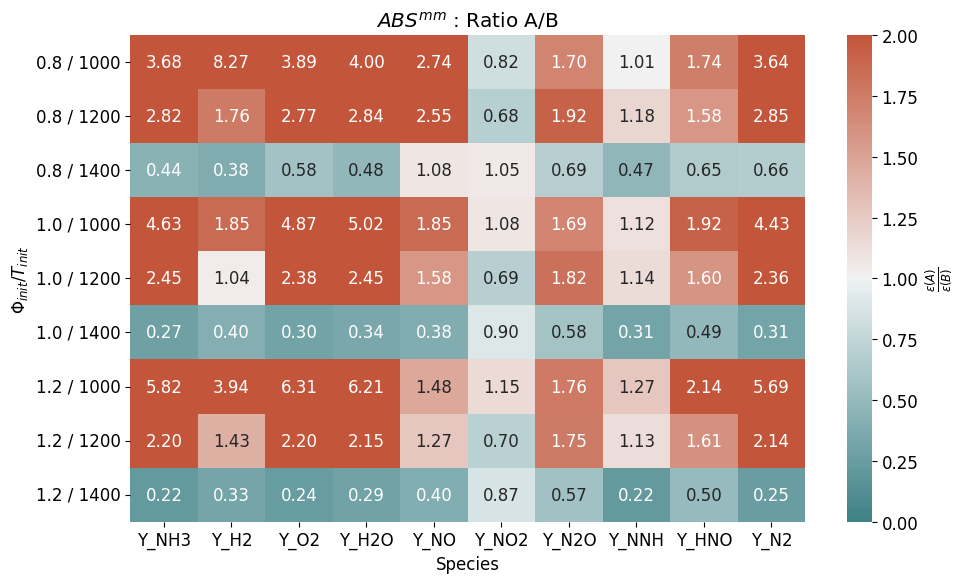

Species        Y_NH3      Y_H2      Y_O2     Y_H2O      Y_NO     Y_NO2  \
Case                                                                     
0.8 / 1000  3.989122  7.341143  3.739636  2.669907  2.019881  0.624605   
0.8 / 1200  2.462463  2.138493  2.617627  2.117117  1.512144  0.441072   
0.8 / 1400  0.489588  0.442925  0.692571  0.333008  0.396080  0.440409   
1.0 / 1000  4.665420  1.444777  3.993050  3.036830  1.862777  1.148520   
1.0 / 1200  2.121127  1.040024  2.057145  2.044225  1.396486  0.567880   
1.0 / 1400  0.328188  0.418762  0.300196  0.387844  0.343200  0.407271   
1.2 / 1000  5.516583  3.077967  5.225031  3.442330  1.602184  1.694577   
1.2 / 1200  1.820575  1.413956  1.835489  1.953222  1.288242  0.757497   
1.2 / 1400  0.365259  0.318367  0.306429  0.424694  0.378430  0.405878   

Species        Y_N2O     Y_NNH     Y_HNO      Y_N2  
Case                                                
0.8 / 1000  2.453804  0.945173  2.872179  3.625262  
0.8 / 1200  1.948101  1.81

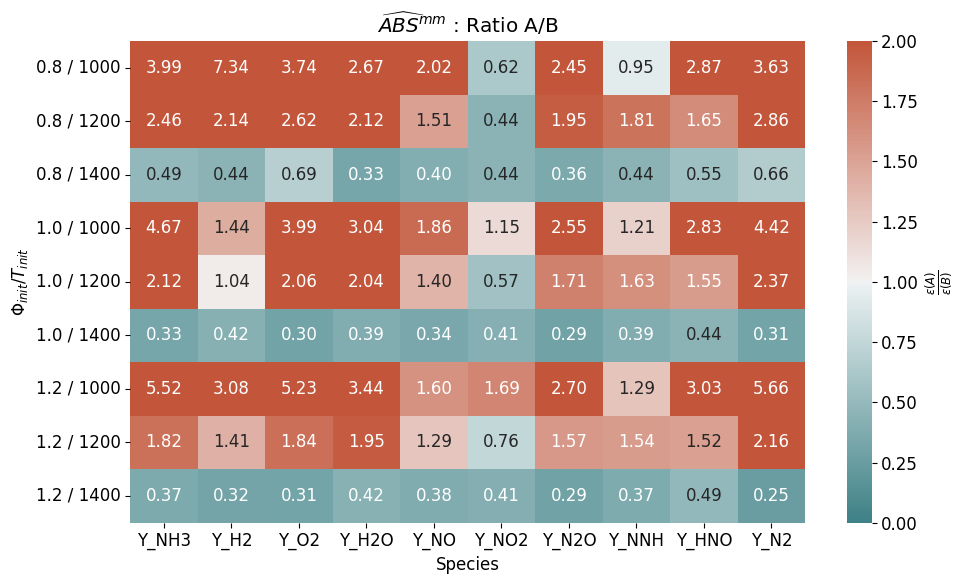

Species        Y_NH3       Y_H2      Y_O2     Y_H2O       Y_NO     Y_NO2  \
Case                                                                       
0.8 / 1000  4.012259  20.642934  4.183623  2.657198   1.950722  0.619783   
0.8 / 1200  2.502544   2.884481  2.325834  9.295856   4.890725  0.337359   
0.8 / 1400  0.303415   0.150427  0.697518  0.195714   0.446264  0.061157   
1.0 / 1000  4.684707   0.713698  6.503666  3.020928   2.316451  2.147922   
1.0 / 1200  2.414669   0.493556  1.687917  4.731068  16.672359  0.610189   
1.0 / 1400  0.281236   0.224697  0.211606  0.160553   0.681939  0.050520   
1.2 / 1000  5.517289   2.291475  7.776051  3.423570   2.483255  6.420585   
1.2 / 1200  2.101647   1.864400  1.668190  3.536434   2.883838  0.941942   
1.2 / 1400  0.336689   0.145814  0.062820  0.059253   1.453254  0.090148   

Species         Y_N2O     Y_NNH     Y_HNO      Y_N2  
Case                                                 
0.8 / 1000  12.744788  0.873270  1.621695  3.625434  
0

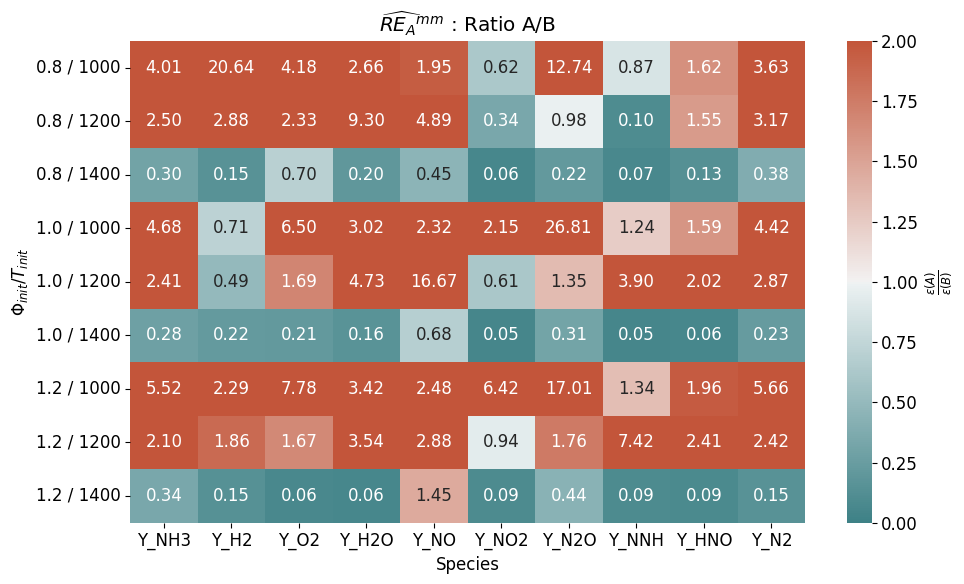

In [44]:
i=0
for key, df in Ratio.items():
    # Création d’un identifiant unique pour chaque couple (Phi_Init, T_Init)
    df['Case'] = df['Phi_Init'].astype(str) + " / " + df['T_Init'].astype(str)
    
    # On ne garde que les colonnes d'espèces
    
    # Construction du DataFrame pivoté pour la heatmap
    heat_data = df.set_index('Case')[input_fitness]
    print(heat_data)
    
    # Tracé
    plt.figure(figsize=(10, 6))
    sns.heatmap(
        heat_data,
        annot=True,
        fmt=".2f",
        center=1,  # centre le colormap sur 1
        vmin=0,
        vmax=2,
        cmap=sns.diverging_palette(200, 20, center="light", as_cmap=True),
        cbar_kws={'label': r"$\frac{\epsilon(A)}{\epsilon(B)}$"}
    )
    plt.title(f"{key} : Ratio A/B")
    plt.xlabel("Species")
    plt.ylabel(r"$Φ_{init} / T_{init}$")
    plt.tight_layout()
    plt.savefig(f"AvsB_{i}.png")
    i=i+1
    plt.show()

In [16]:
change_ref_mm , change_A_mm = _preprocess_data(Ref,A,input_fitness,False,"minmax")
_,change_B =  _preprocess_data(Ref,B,input_fitness,False,"minmax")

change_ref_log_mm , change_A_log_mm = _preprocess_data(Ref,A,input_fitness,True,"minmax")
_,change_B_log_mm =  _preprocess_data(Ref,B,input_fitness,True,"minmax")

path = "Profile_plot"


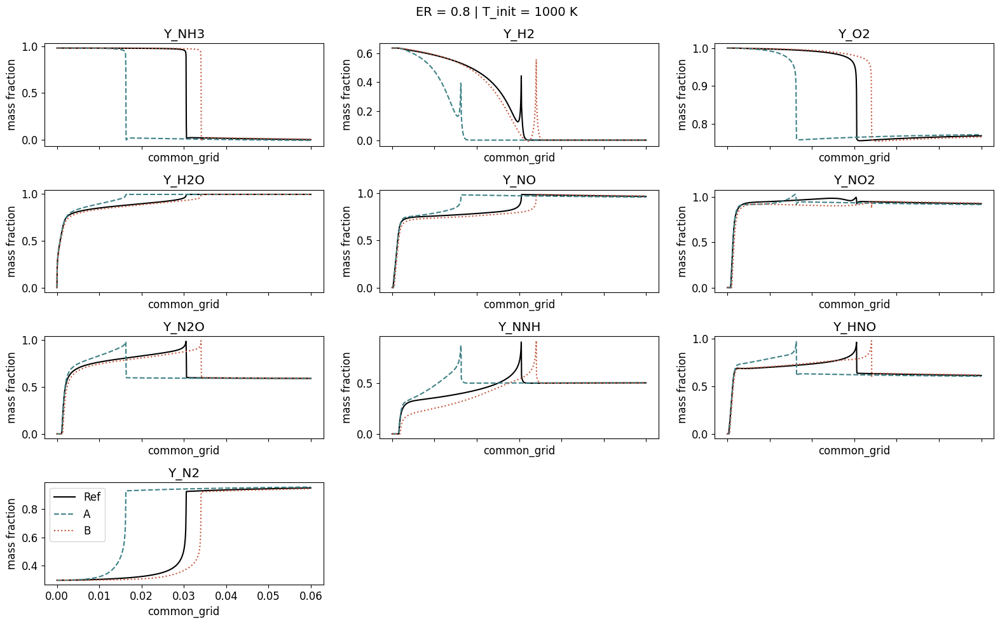

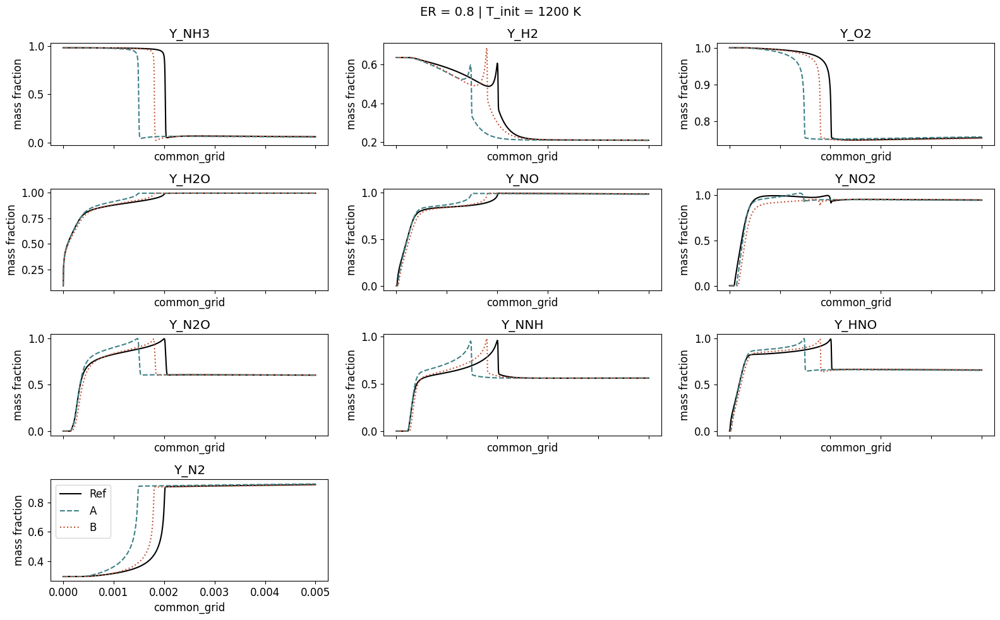

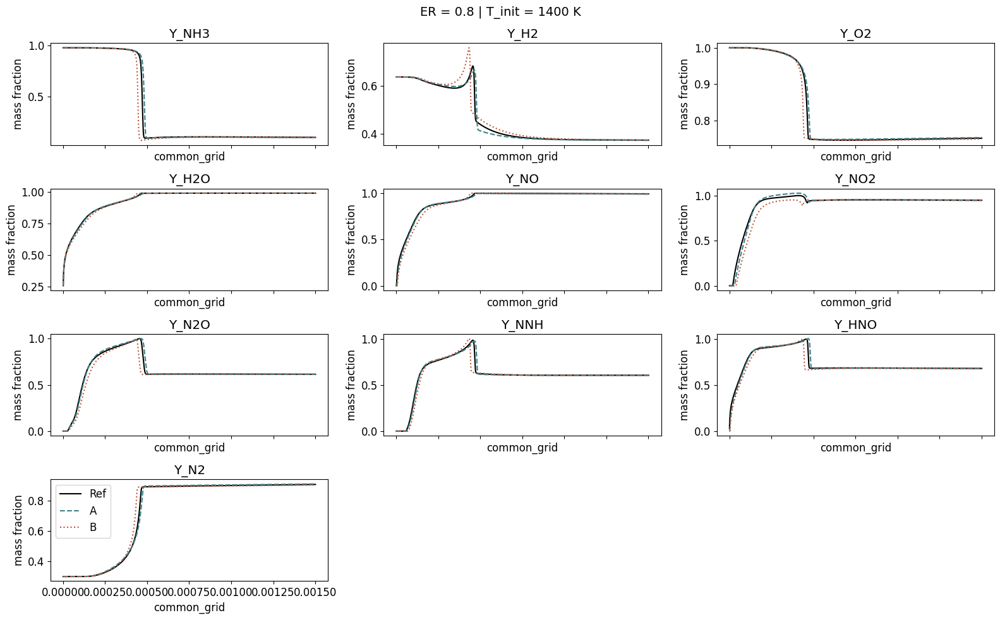

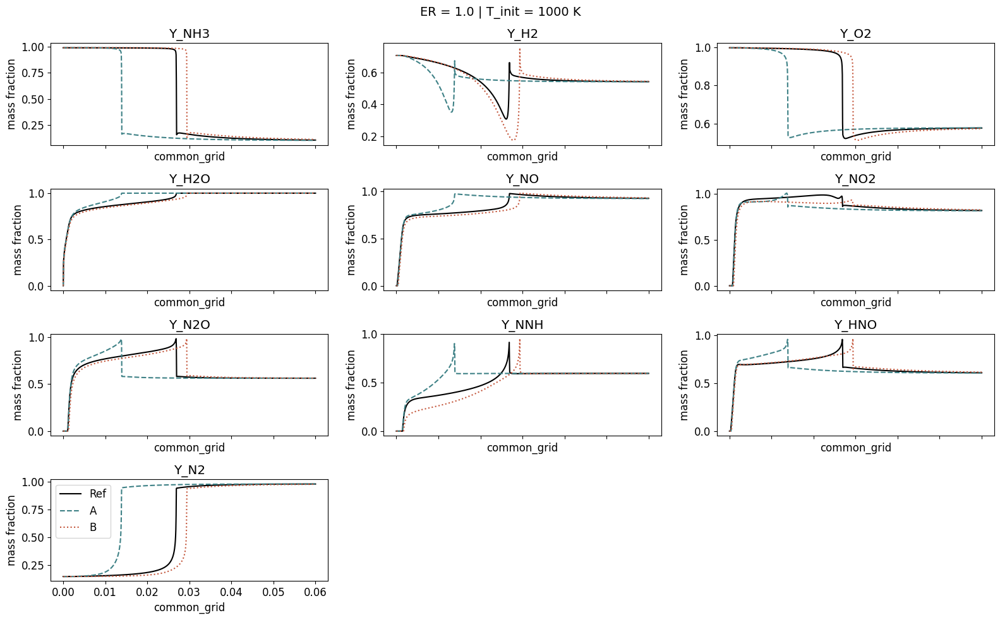

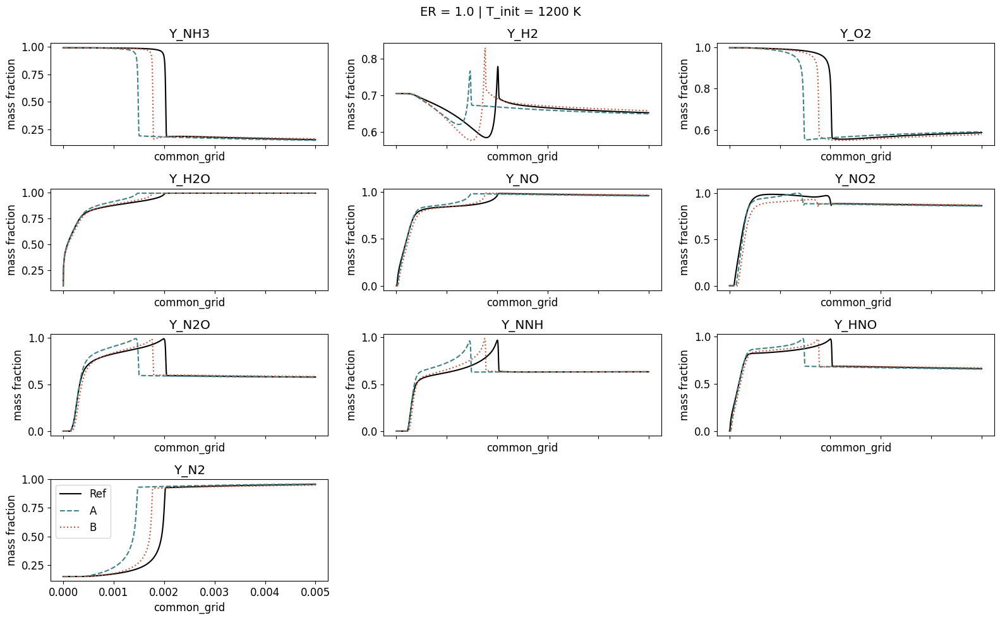

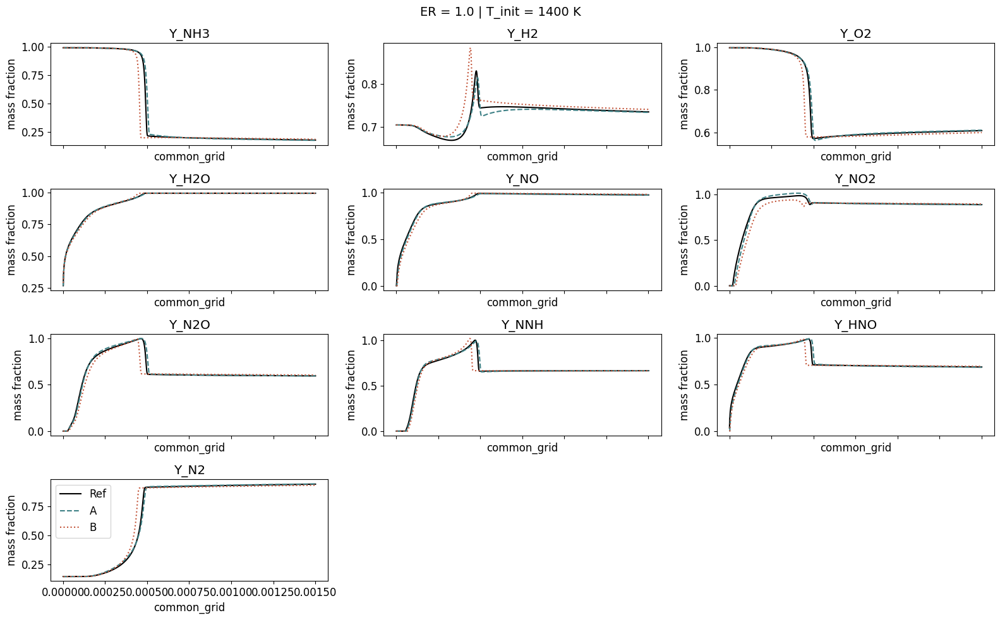

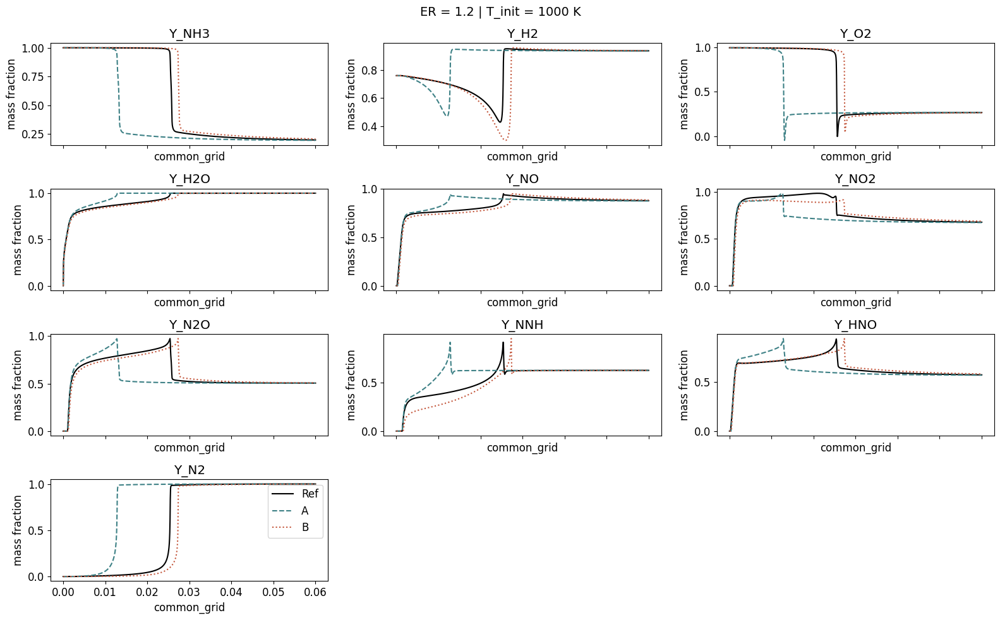

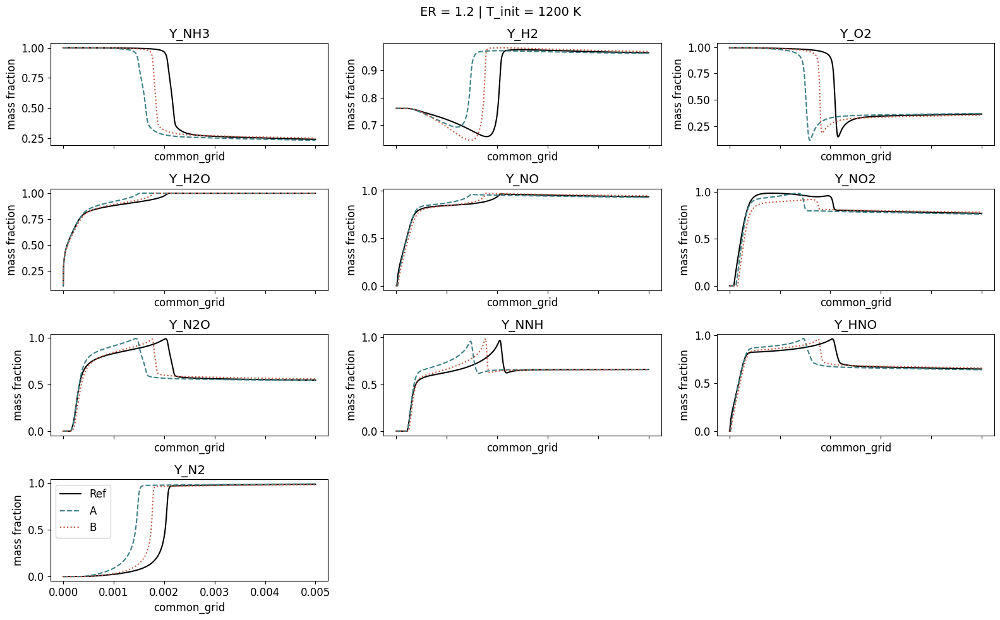

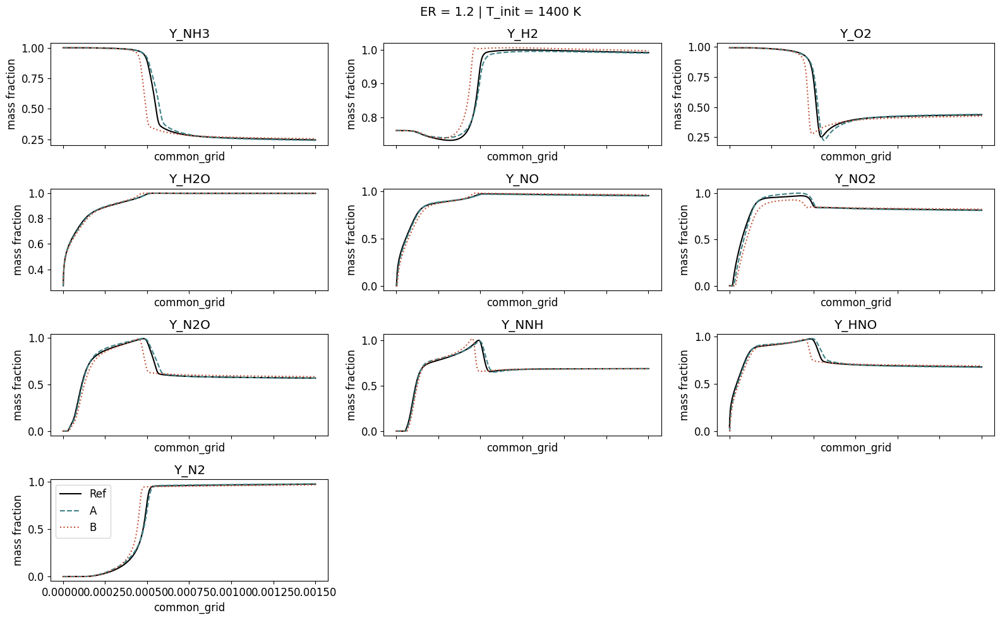

In [19]:
#Profiles Log + MM

Phi_init = Ref["Phi_Init"].unique() 
T_init = Ref["T_Init"].unique()

os.makedirs(os.path.join(path,"LOG_MM"),exist_ok=True)
for ER in Phi_init:
    for T in T_init:
        loc_ref = change_ref_log_mm[(change_ref_log_mm["Phi_Init"] == ER) & (change_ref_log_mm["T_Init"] == T)]
        loc_A = change_A_log_mm[(change_A_log_mm["Phi_Init"] == ER) & (change_A_log_mm["T_Init"] == T)]
        loc_B = change_B_log_mm[(change_B_log_mm["Phi_Init"] == ER) & (change_B_log_mm["T_Init"] == T)]

        # Création figure
        fig, axes = plt.subplots(
            nrows=len(input_fitness)//3 + (1 if len(input_fitness) % 3 else 0),
            ncols=3,
            figsize=(16, 10),
            sharex=True
        )
        axes = axes.flatten()

        # Boucle sur les espèces
        for i, sp in enumerate(input_fitness):
            ax = axes[i]
            ax.plot(loc_ref["common_grid"], loc_ref[sp],color="k", label="Ref")
            ax.plot(loc_A["common_grid"], loc_A[sp], linestyle='--',color = "#3e8186", label="A")
            ax.plot(loc_B["common_grid"], loc_B[sp], linestyle=':', color ="#c3553a",label=f"B")

            ax.set_title(sp)
            ax.set_xlabel("common_grid")
            ax.set_ylabel("mass fraction")

        # On retire les axes vides == si nb espèces pas multiple de 3
        for j in range(len(input_fitness), len(axes)):
            fig.delaxes(axes[j])

        fig.suptitle(f"ER = {ER} | T_init = {T} K", fontsize=14)
        plt.tight_layout()
        plt.legend()
        name =f"ER_{ER}_T_{T}.png"
        plt.savefig(os.path.join(path,"LOG_MM",name))
        plt.show()


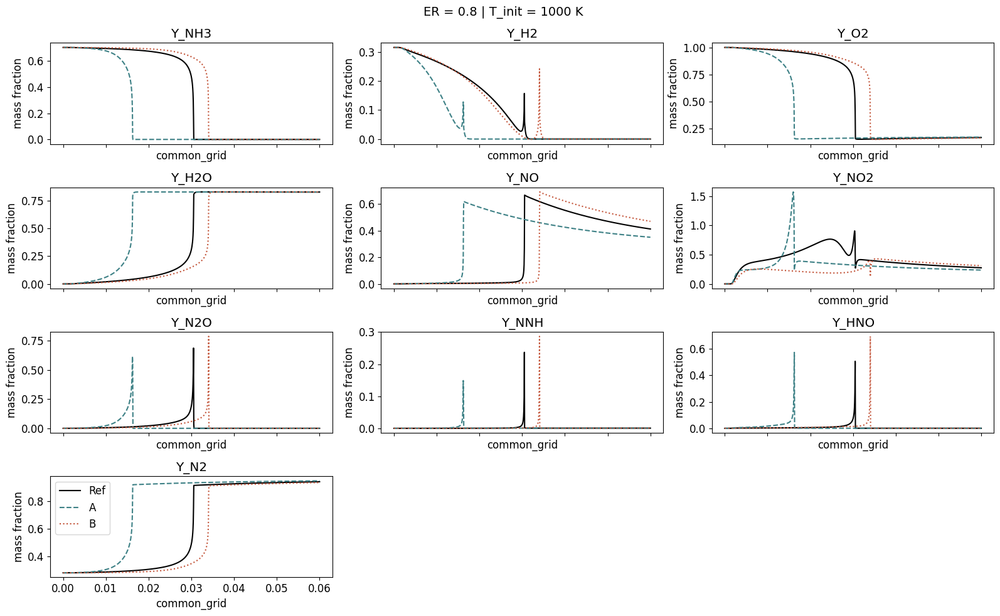

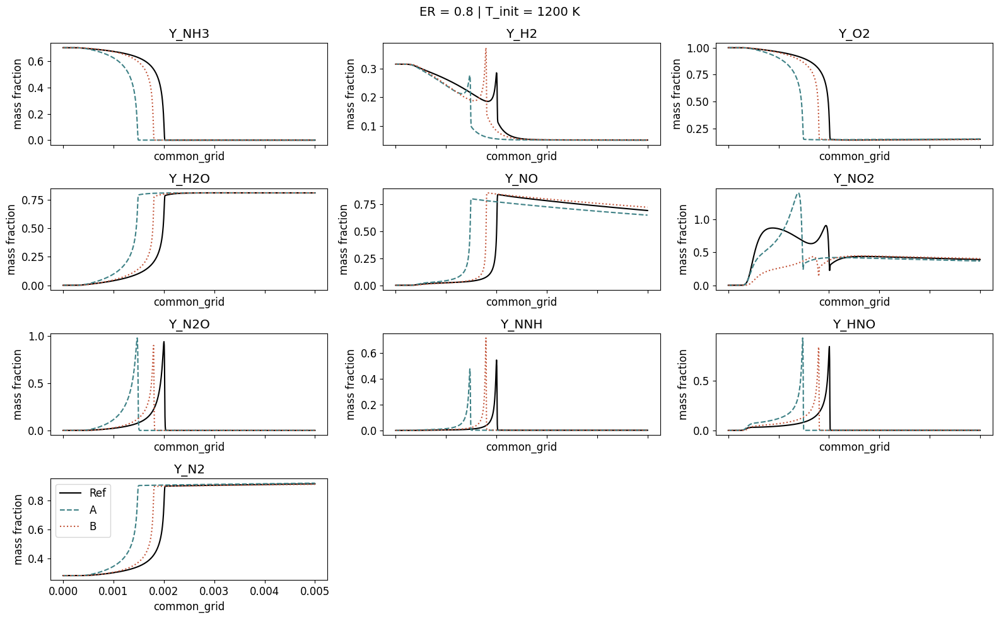

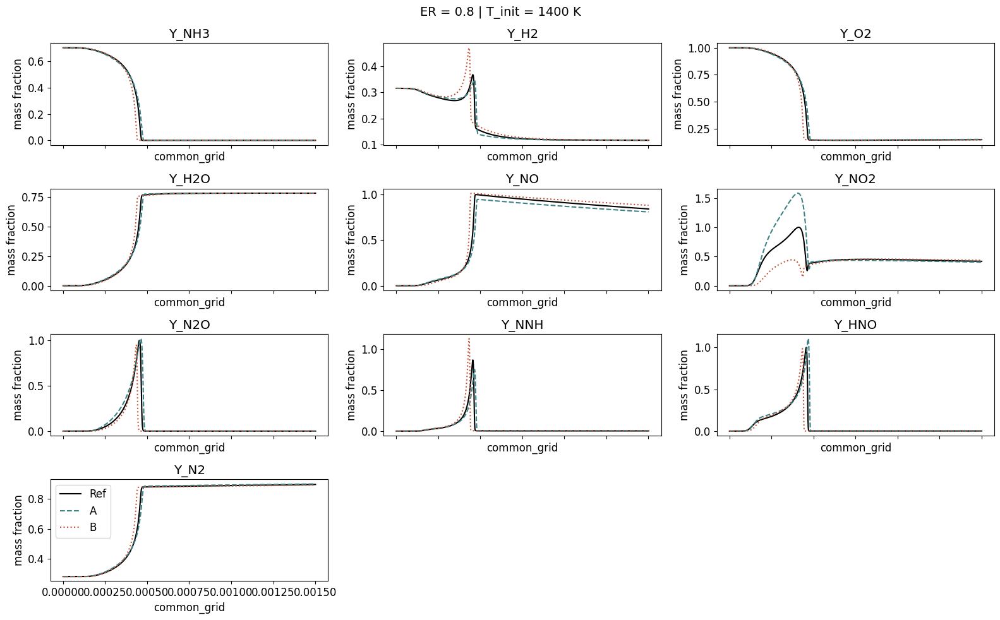

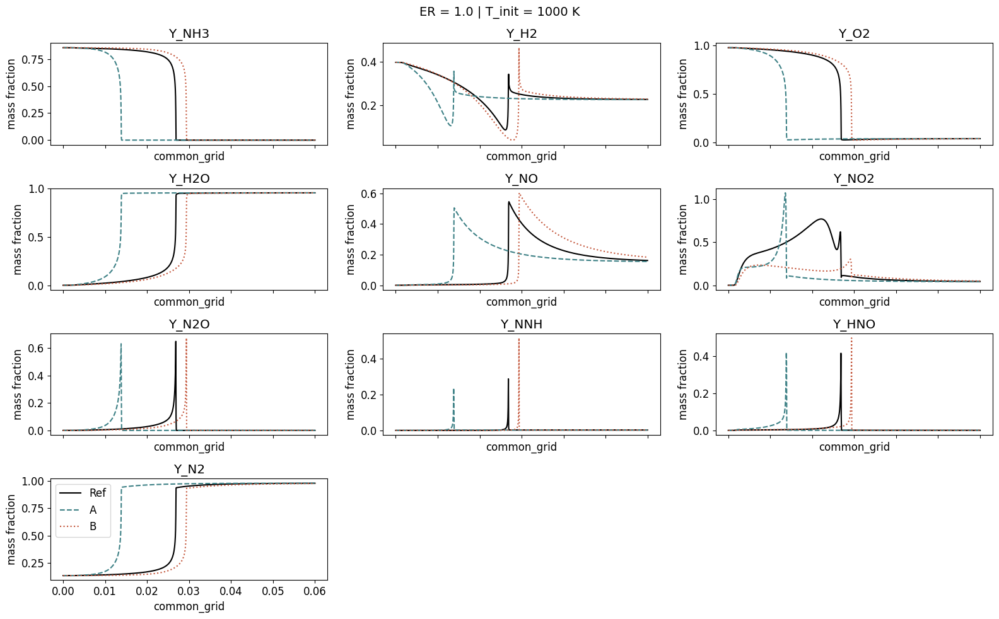

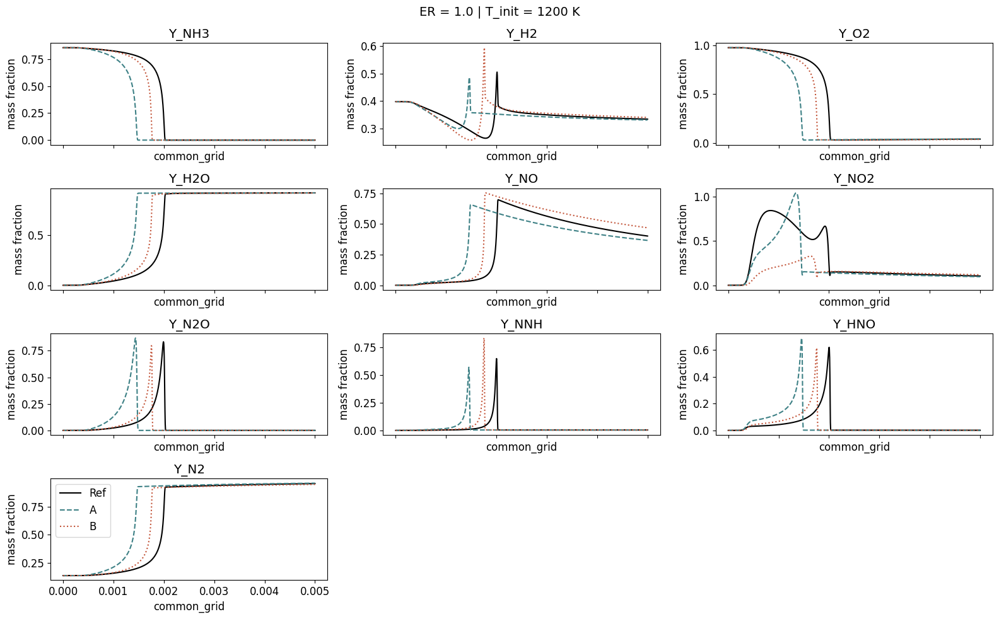

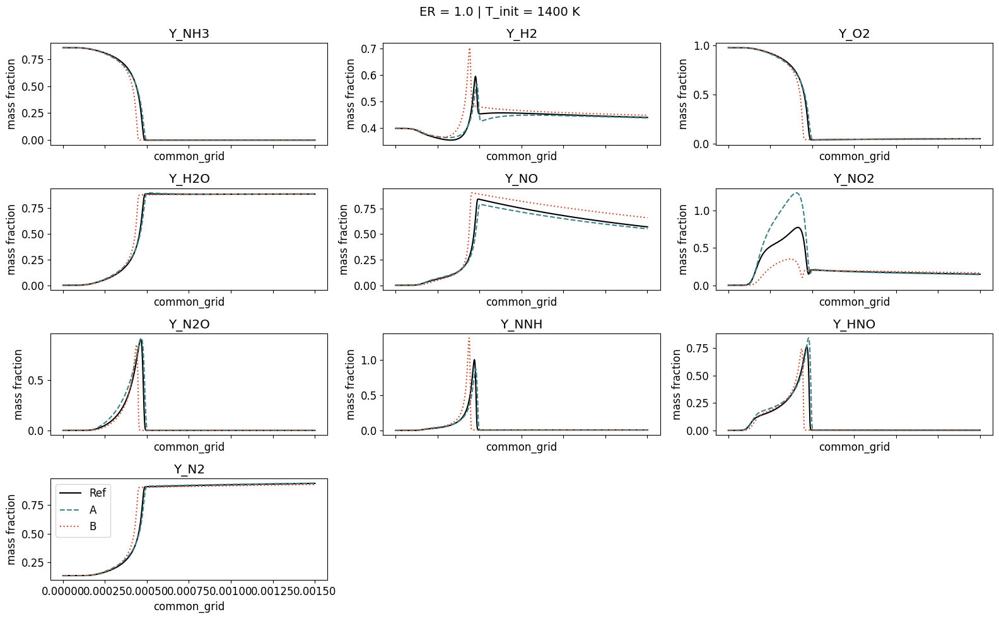

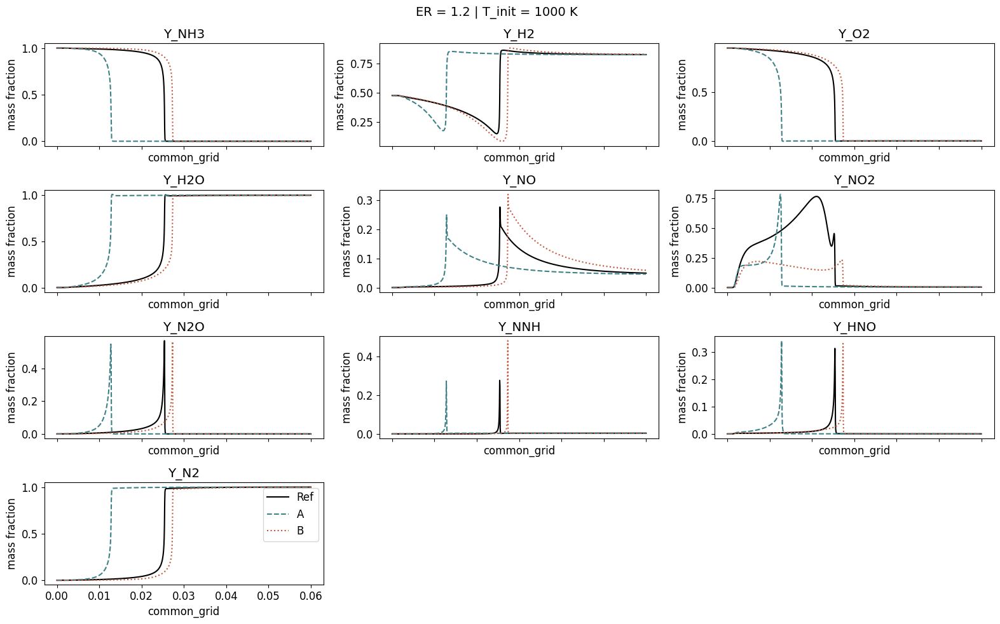

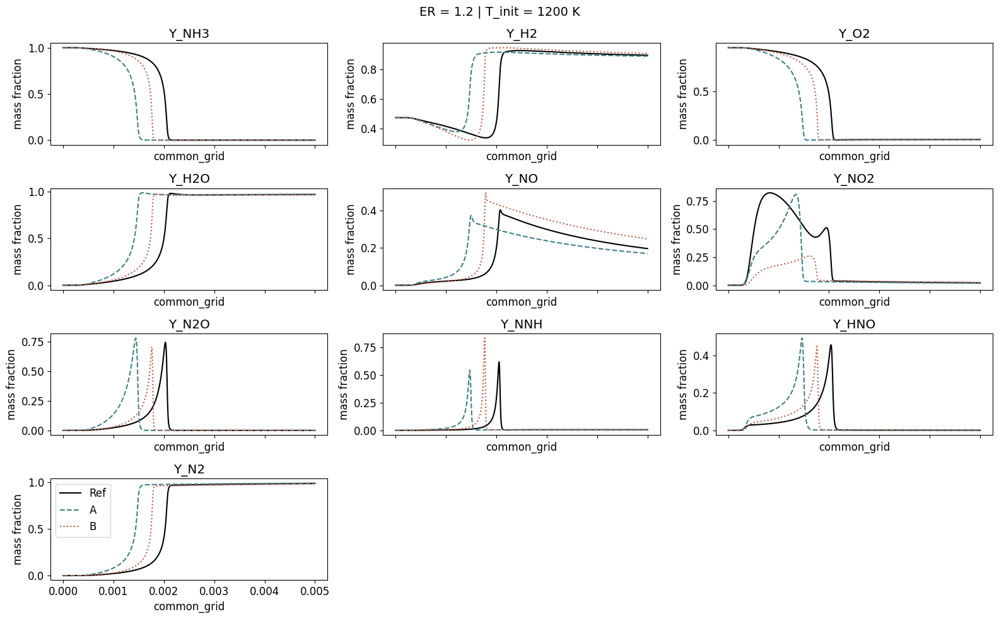

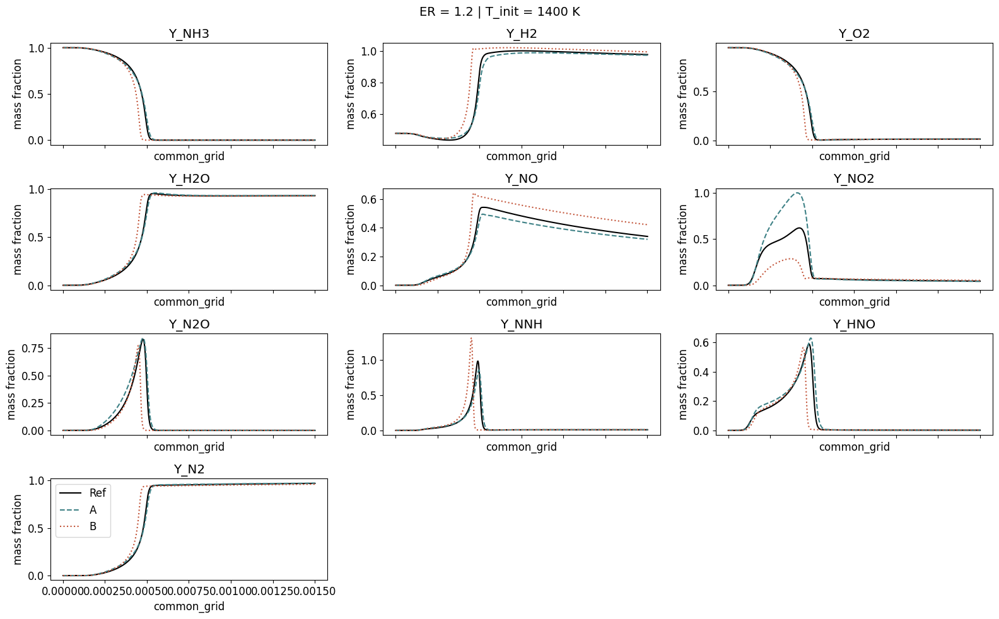

In [20]:
#Profiles MM

Phi_init = Ref["Phi_Init"].unique() 
T_init = Ref["T_Init"].unique()

os.makedirs(os.path.join(path,"MM"),exist_ok=True)
for ER in Phi_init:
    for T in T_init:
        loc_ref = change_ref_mm[(change_ref_mm["Phi_Init"] == ER) & (change_ref_mm["T_Init"] == T)]
        loc_A = change_A_mm[(change_A_mm["Phi_Init"] == ER) & (change_A_mm["T_Init"] == T)]
        loc_B = change_B[(change_B["Phi_Init"] == ER) & (change_B["T_Init"] == T)]

        # Création figure
        fig, axes = plt.subplots(
            nrows=len(input_fitness)//3 + (1 if len(input_fitness) % 3 else 0),
            ncols=3,
            figsize=(16, 10),
            sharex=True
        )
        axes = axes.flatten()

        # Boucle sur les espèces
        for i, sp in enumerate(input_fitness):
            ax = axes[i]
            ax.plot(loc_ref["common_grid"], loc_ref[sp],color="k", label="Ref")
            ax.plot(loc_A["common_grid"], loc_A[sp], linestyle='--',color = "#3e8186", label="A")
            ax.plot(loc_B["common_grid"], loc_B[sp], linestyle=':', color ="#c3553a",label=f"B")

            ax.set_title(sp)
            ax.set_xlabel("common_grid")
            ax.set_ylabel("mass fraction")

        # On retire les axes vides == si nb espèces pas multiple de 3
        for j in range(len(input_fitness), len(axes)):
            fig.delaxes(axes[j])

        fig.suptitle(f"ER = {ER} | T_init = {T} K", fontsize=14)
        plt.tight_layout()
        plt.legend()
        name =f"ER_{ER}_T_{T}.png"
        plt.savefig(os.path.join(path,"MM",name))
        plt.show()


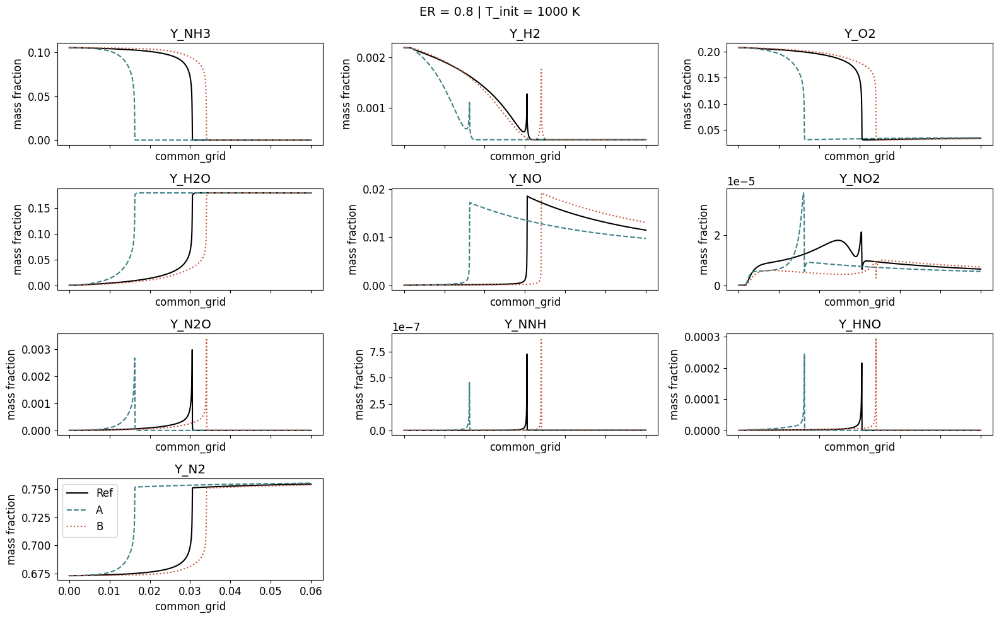

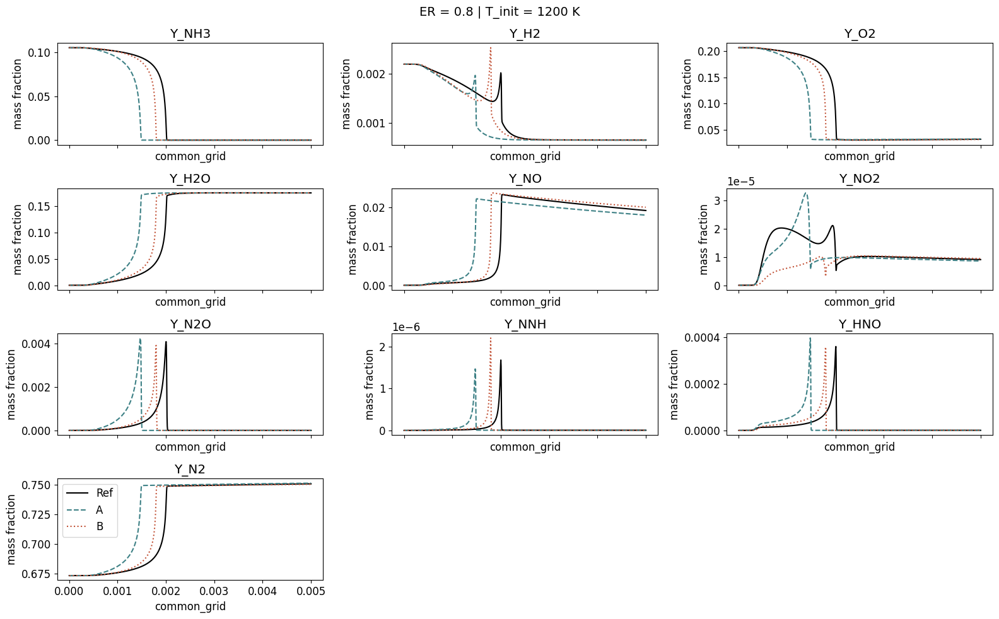

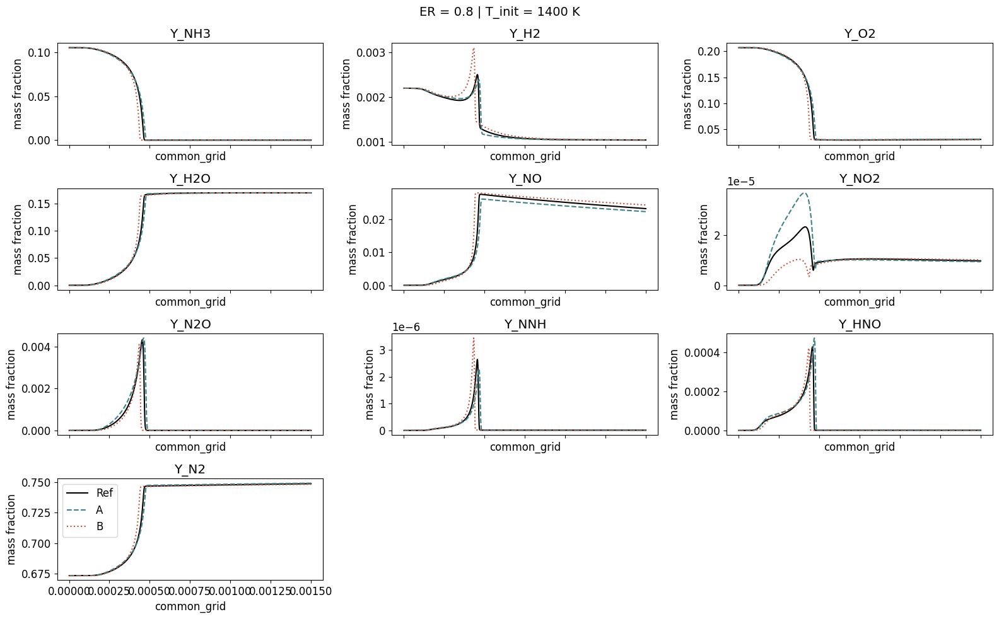

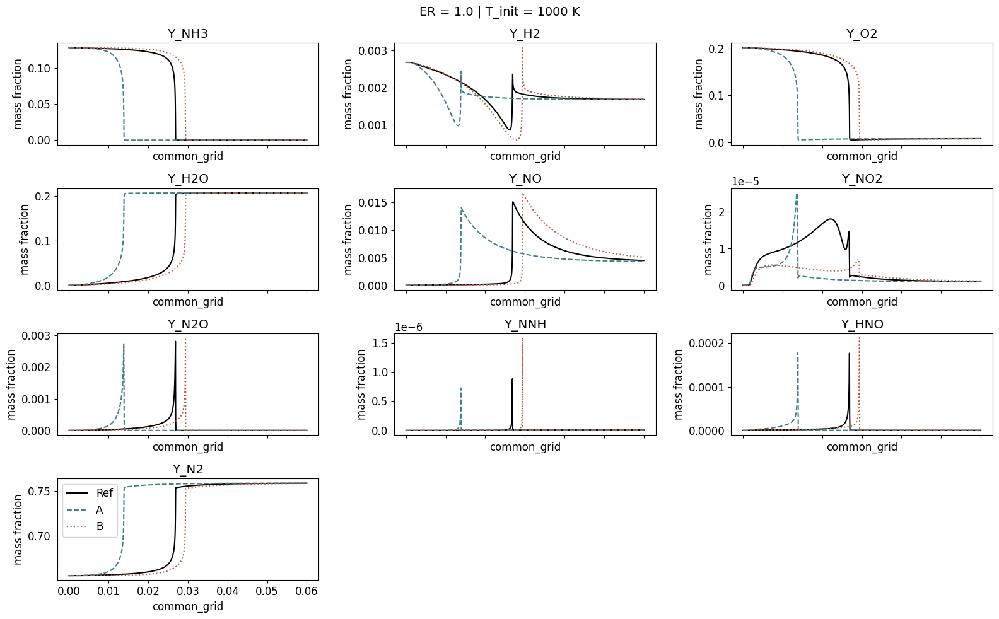

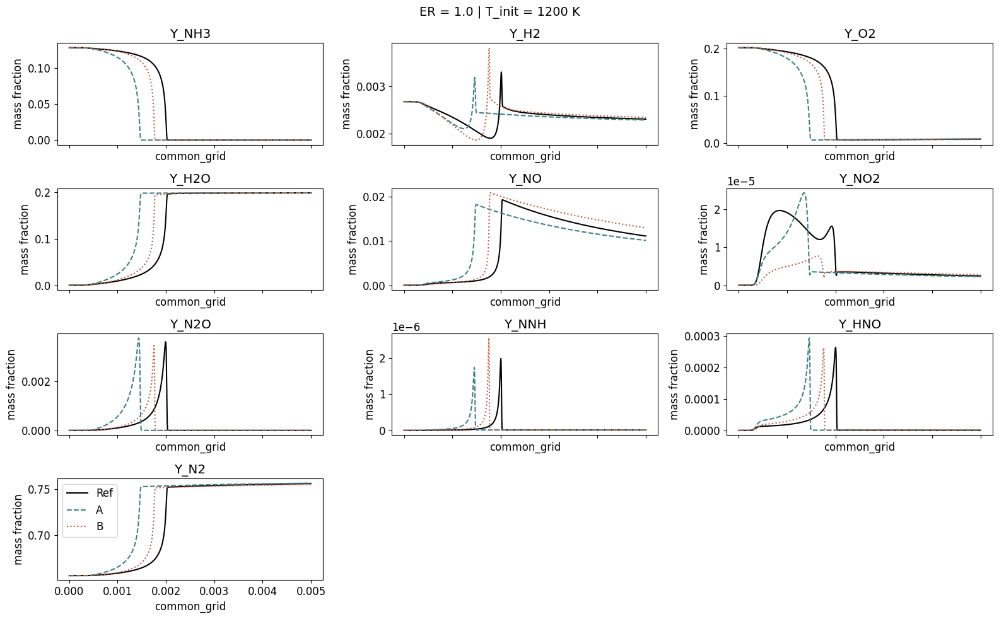

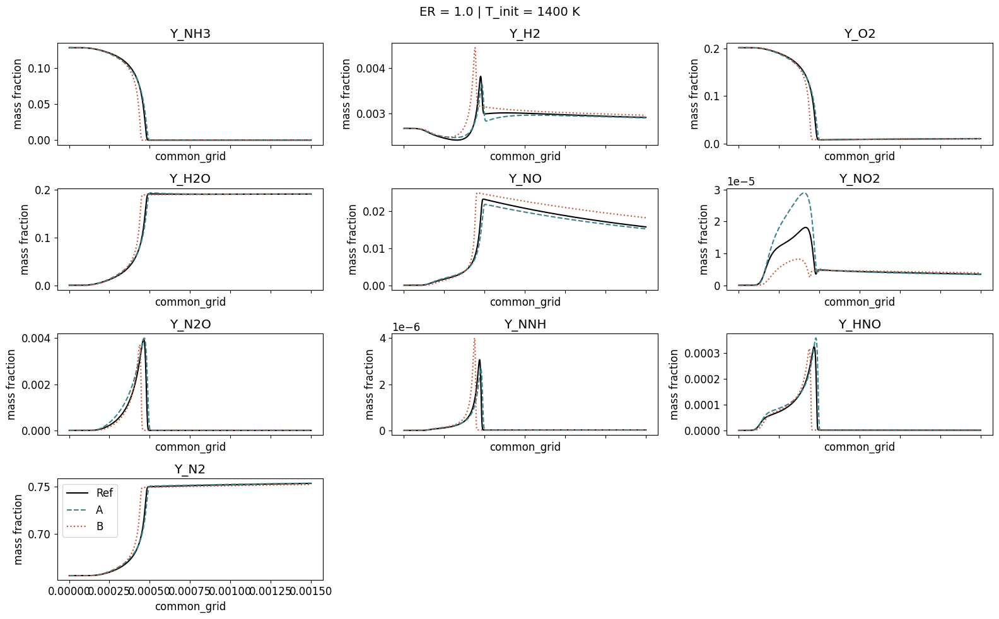

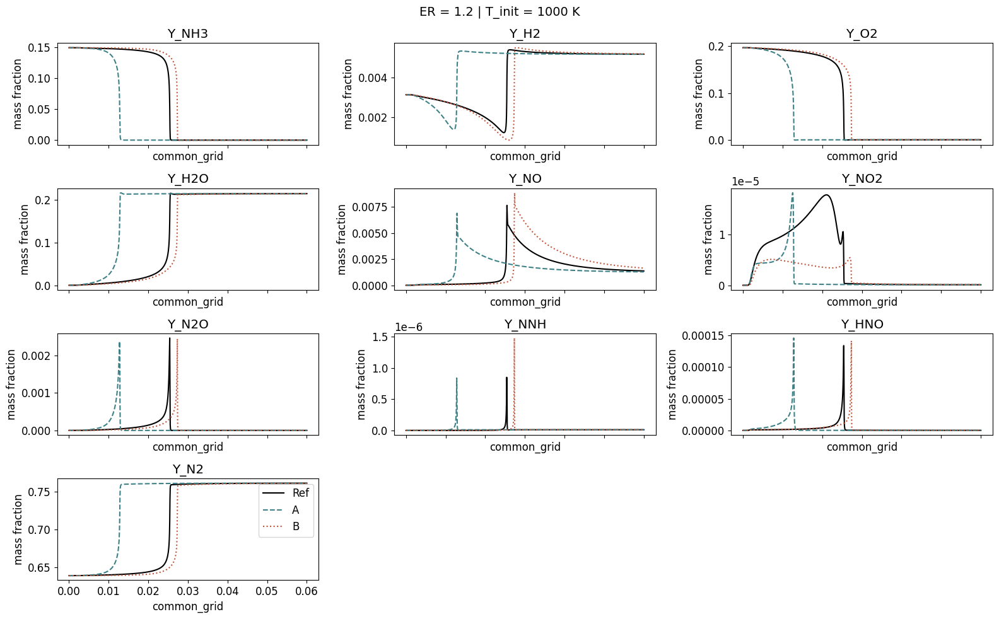

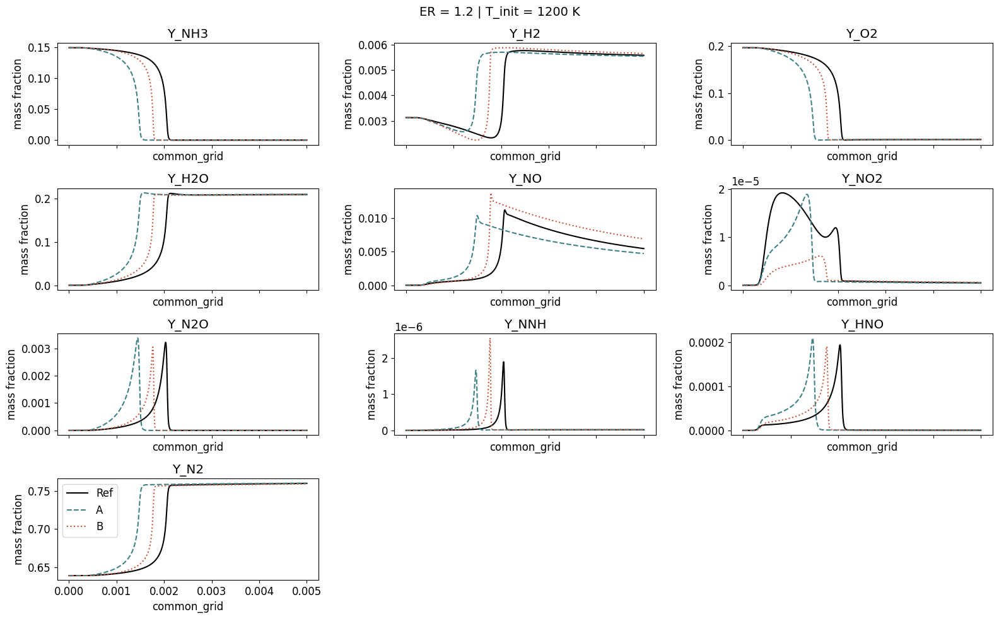

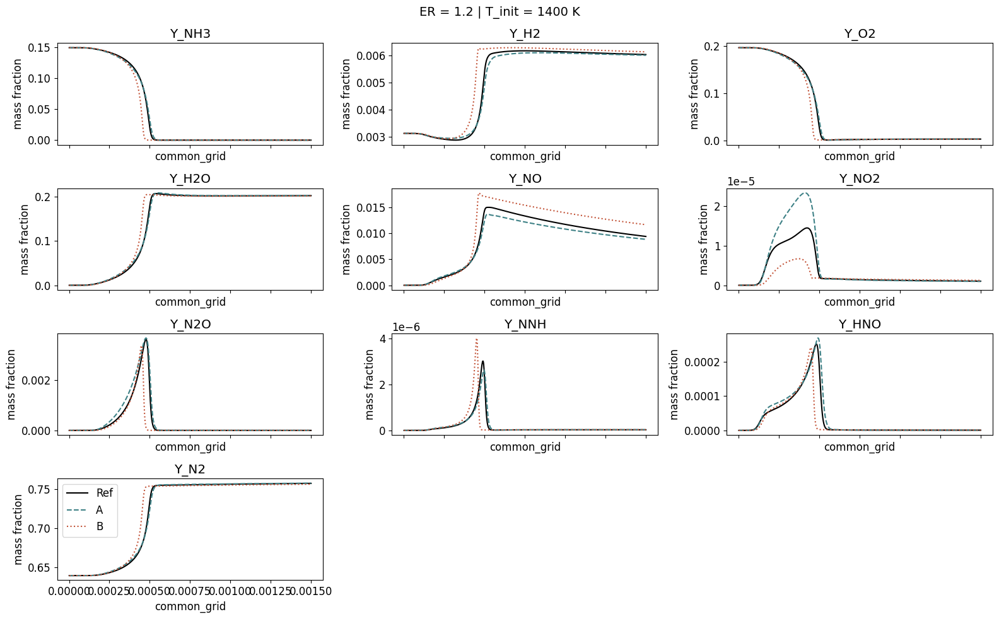

In [17]:
#Profiles RAW

Phi_init = Ref["Phi_Init"].unique() 
T_init = Ref["T_Init"].unique()

os.makedirs(os.path.join(path,"RAW"),exist_ok=True)
for ER in Phi_init:
    for T in T_init:
        loc_ref = Ref[(Ref["Phi_Init"] == ER) & (Ref["T_Init"] == T)]
        loc_A = A[(A["Phi_Init"] == ER) & (A["T_Init"] == T)]
        loc_B = B[(B["Phi_Init"] == ER) & (B["T_Init"] == T)]

        # Création figure
        fig, axes = plt.subplots(
            nrows=len(input_fitness)//3 + (1 if len(input_fitness) % 3 else 0),
            ncols=3,
            figsize=(16, 10),
            sharex=True
        )
        axes = axes.flatten()

        # Boucle sur les espèces
        for i, sp in enumerate(input_fitness):
            ax = axes[i]
            ax.plot(loc_ref["common_grid"], loc_ref[sp],color="k", label="Ref")
            ax.plot(loc_A["common_grid"], loc_A[sp], linestyle='--',color = "#3e8186", label="A")
            ax.plot(loc_B["common_grid"], loc_B[sp], linestyle=':', color ="#c3553a",label=f"B")

            ax.set_title(sp)
            ax.set_xlabel("common_grid")
            ax.set_ylabel("mass fraction")

        # On retire les axes vides == si nb espèces pas multiple de 3
        for j in range(len(input_fitness), len(axes)):
            fig.delaxes(axes[j])

        fig.suptitle(f"ER = {ER} | T_init = {T} K", fontsize=14)
        plt.tight_layout()
        plt.legend()
        name =f"ER_{ER}_T_{T}.png"
        plt.savefig(os.path.join(path,"RAW",name))
        plt.show()


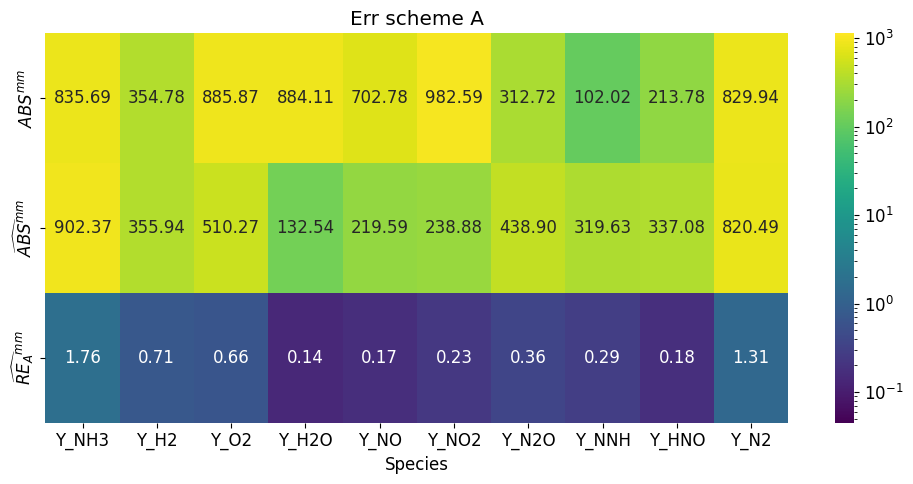

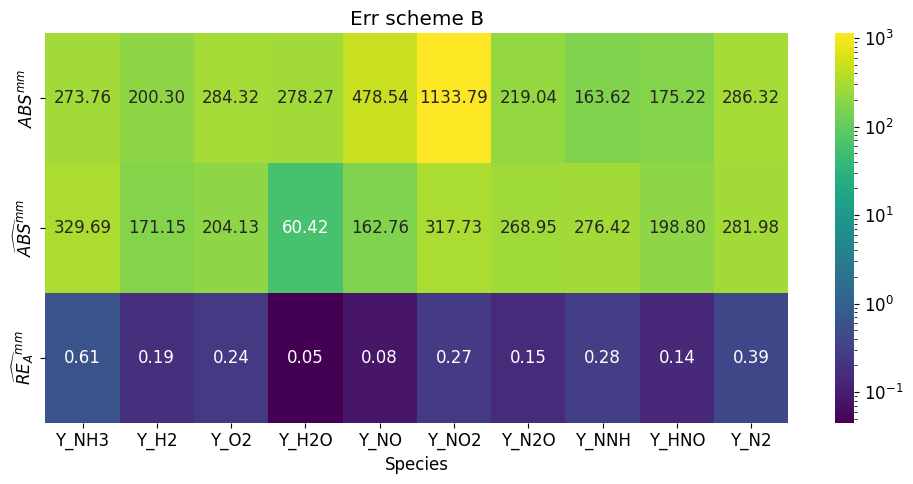

In [7]:
comparisons = [
    (ABS, "mm"),
    (ABS, "log_mm"),
    (RE_A, "log_mm"),
    
]

# Calcul des ratios
Err_B_All = {}
Err_A_All = {}
for F_obj, trans_name in comparisons:
    do_log = transformations[trans_name]["do_log"]
    norm_type = transformations[trans_name]["norm_type"]
    
    Err_A = F_obj(Ref, A, input_fitness, True, do_log, norm_type)
    Err_B = F_obj(Ref, B, input_fitness, True, do_log, norm_type)
    label = make_label(F_obj.__name__, do_log, norm_type)
    Err_B_All[label] = Err_B[input_fitness].sum(axis=0)
    Err_A_All[label]= Err_A[input_fitness].sum(axis=0)

# Transformer en DataFrame
df_Err_A_All = pd.DataFrame(Err_A_All).T
df_Err_B_All = pd.DataFrame(Err_B_All).T




Norm = LogNorm(min(df_Err_A_All.min().min(),df_Err_B_All.min().min()), max(df_Err_A_All.max().max(),df_Err_B_All.max().max()))

plt.figure(figsize=(10,5))
plt.title("Err scheme A")
ax = sns.heatmap(df_Err_A_All,
                 annot=True,
                 fmt=".2f",
                 cmap = "viridis",
                 norm = Norm
                 )

cbar.set_label(r"$\epsilon(A)$")

plt.tight_layout()
plt.show()

plt.figure(figsize=(10,5))
# Heatmap centrée sur 1
plt.title("Err scheme B")
ax = sns.heatmap(df_Err_B_All,
                 annot=True,
                 fmt=".2f",
                 cmap = "viridis",
                 norm = Norm
                 )

cbar.set_label(r"$\epsilon(B)$")

plt.tight_layout()
plt.show()



In [56]:
def plot_double_heatmap(Ref, A, B, input_fitness, func, transf_name):
    """
    Trace deux heatmaps côte à côte pour comparer deux jeux de données (A, B)
    avec la fonction d'erreur et la transformation choisies.
    L'échelle de couleur est commune aux deux plots.
    """
    # --- Récupération des paramètres de transformation ---
    transf = transformations[transf_name]
    do_log = transf["do_log"]
    norm_type = transf["norm_type"]

    # --- Label mathématique pour le titre ---
    label = make_label(func.__name__, do_log, norm_type)

    # --- Calcul des erreurs pour A ---
    Err_A = func(Ref, A, input_fitness, True, do_log, norm_type)
    Err_A_tot = func(Ref, A, input_fitness, False, do_log, norm_type)
    Err_A_Ratio = Err_A.copy()
    Err_A_Ratio[input_fitness] = Err_A[input_fitness] / Err_A_tot * 100
    Err_A_Ratio["Total"] = Err_A[input_fitness].sum(axis=1) / Err_A_tot * 100
    Err_A_Ratio["label"] = Err_A_Ratio.apply(lambda r: f"Phi={r['Phi_Init']} | T={r['T_Init']}", axis=1)
    heatmap_A = Err_A_Ratio.set_index("label")[input_fitness + ["Total"]]

    # --- Calcul des erreurs pour B ---
    Err_B = func(Ref, B, input_fitness, True, do_log, norm_type)
    Err_B_tot = func(Ref, B, input_fitness, False, do_log, norm_type)
    Err_B_Ratio = Err_B.copy()
    Err_B_Ratio[input_fitness] = Err_B[input_fitness] / Err_B_tot * 100
    Err_B_Ratio["Total"] = Err_B[input_fitness].sum(axis=1)/ Err_B_tot * 100
    Err_B_Ratio["label"] = Err_B_Ratio.apply(lambda r: f"Phi={r['Phi_Init']} | T={r['T_Init']}", axis=1)
    heatmap_B = Err_B_Ratio.set_index("label")[input_fitness + ["Total"]]

    # --- Détermination de l'échelle commune ---
    combined = np.concatenate([
        heatmap_A[input_fitness].to_numpy().ravel(),
        heatmap_B[input_fitness].to_numpy().ravel()
    ])
    vmin, vmax = np.nanmin(combined), np.nanmax(combined)

    # --- Masques pour la colonne "Total" ---
    mask_A = np.zeros_like(heatmap_A, dtype=bool)
    mask_B = np.zeros_like(heatmap_B, dtype=bool)
    mask_A[:, heatmap_A.columns.get_loc("Total")] = True
    mask_B[:, heatmap_B.columns.get_loc("Total")] = True

    # --- Création de la figure ---
    fig, axes = plt.subplots(1, 2, figsize=(20, 8), sharey=True)

    # === Heatmap A ===
    sns.heatmap(
        heatmap_A, fmt=".2f", annot=True, cmap="viridis",
        mask=mask_A, annot_kws={"size": 10}, ax=axes[0],
        vmin=vmin, vmax=vmax
    )
    jA_total = heatmap_A.columns.get_loc("Total")
    for i in range(heatmap_A.shape[0]):
        axes[0].text(jA_total + 0.6, i + 0.5,
                     f"{heatmap_A.iloc[i, jA_total]:.1f}",
                     ha='center', va='center', color='black', fontweight='bold')

    axes[0].set_title(rf"{label}(A) = {Err_A_tot:.3f}", fontsize=14)
    axes[0].set_ylabel("")
    axes[0].set_xlabel("")

    # === Heatmap B ===
    sns.heatmap(
        heatmap_B, fmt=".2f", annot=True, cmap="viridis",
        mask=mask_B, annot_kws={"size": 10}, ax=axes[1],
        vmin=vmin, vmax=vmax
    )
    jB_total = heatmap_B.columns.get_loc("Total")
    for i in range(heatmap_B.shape[0]):
        axes[1].text(jB_total + 0.6, i + 0.5,
                     f"{heatmap_B.iloc[i, jB_total]:.1f}",
                     ha='center', va='center', color='black', fontweight='bold')

    axes[1].set_title(rf"{label}(B) = {Err_B_tot:.3f}", fontsize=14)
    axes[1].set_ylabel("")
    axes[1].set_xlabel("")



    plt.tight_layout(rect=[0, 0, 0.9, 1])
    plt.show()

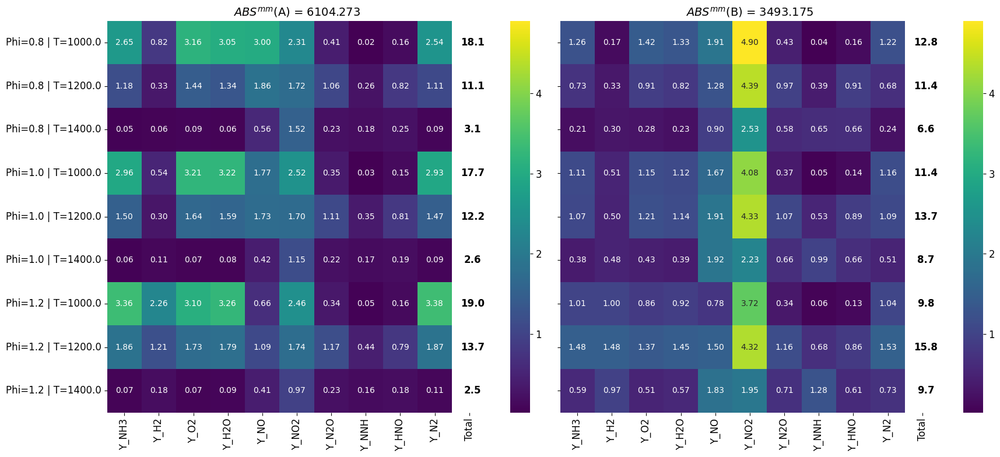

In [57]:
# Exemple d’appel :
plot_double_heatmap(
    Ref, A, B,
    input_fitness,
    func=ABS,                 # ou RE_A, RMSE, etc.
    transf_name="mm"      # "mm", "std", "raw", etc.
)


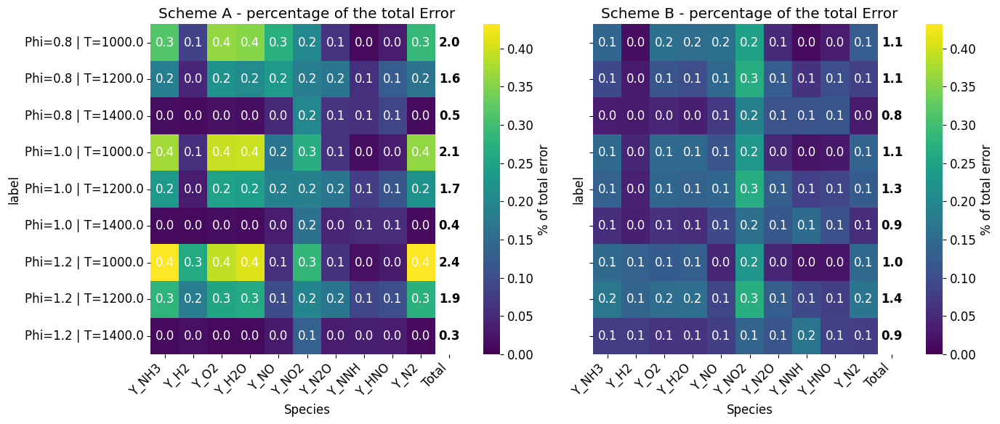

In [58]:
Err_A = RMSE(Ref, A, input_fitness, True, False, "minmax")
Err_B = RMSE(Ref, B, input_fitness, True, False, "minmax")

# Erreurs normalisées (pourcentage du total)
Err_A_Ratio = Err_A.copy()
Err_A_Ratio[input_fitness] = Err_A[input_fitness] 

Err_B_Ratio = Err_B.copy()
Err_B_Ratio[input_fitness] = Err_B[input_fitness] 

# Ajout du label (Phi, T)
Err_A_Ratio["Total"] = Err_A[input_fitness].sum(axis=1)
Err_A_Ratio["label"] = Err_A_Ratio.apply(lambda r: f"Phi={r['Phi_Init']} | T={r['T_Init']}", axis=1)
Err_B_Ratio["Total"] = Err_B[input_fitness].sum(axis=1)
Err_B_Ratio["label"] = Err_B_Ratio.apply(lambda r: f"Phi={r['Phi_Init']} | T={r['T_Init']}", axis=1)

# Matrices à tracer
heatmap_A = Err_A_Ratio.set_index("label")[input_fitness+["Total"]]
heatmap_B = Err_B_Ratio.set_index("label")[input_fitness+["Total"]]
# Création du masque : enlève juste la couleur pour Total
mask_A = np.zeros_like(heatmap_A, dtype=bool)
mask_A[:, heatmap_A.columns.get_loc("Total")] = True
mask_B = np.zeros_like(heatmap_B, dtype=bool)
mask_B[:, heatmap_B.columns.get_loc("Total")] = True

fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharey=True)

# ===== Heatmap A =====
sns.heatmap(
    heatmap_A,
    ax=axes[0],
    fmt=".1f",
    annot=False,      # <- on va annoter manuellement ensuite
    cmap="viridis",
    mask=mask_A,
    cbar_kws={'label': '% of total error'},
    vmin=0, vmax=max(heatmap_A.drop(columns="Total").max().max(),
                     heatmap_B.drop(columns="Total").max().max())
)
axes[0].set_title("Scheme A - percentage of the total Error")
axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=45, ha='right')

# On annote toutes les espèces sauf Total (couleur)
for i in range(heatmap_A.shape[0]):
    for j, col in enumerate(heatmap_A.columns[:-1]):  # sauf dernière colonne
        axes[0].text(j + 0.5, i + 0.5, f"{heatmap_A.iloc[i, j]:.1f}",
                     ha='center', va='center', color='white')

# On annote manuellement TOTAL (sans couleur)
j_total = heatmap_A.columns.get_loc("Total")
for i in range(heatmap_A.shape[0]):
    axes[0].text(j_total + 0.5, i + 0.5,
                 f"{heatmap_A.iloc[i, j_total]:.1f}",
                 ha='center', va='center', color='black', fontweight='bold')

# ===== Heatmap B =====
sns.heatmap(
    heatmap_B,
    ax=axes[1],
    fmt=".1f",
    annot=False,
    cmap="viridis",
    mask=mask_B,
    cbar_kws={'label': '% of total error'},
    vmin=0, vmax=max(heatmap_A.drop(columns="Total").max().max(),
                     heatmap_B.drop(columns="Total").max().max())
)
axes[1].set_title("Scheme B - percentage of the total Error")
axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=45, ha='right')

# Annot espèce
for i in range(heatmap_B.shape[0]):
    for j, col in enumerate(heatmap_B.columns[:-1]):
        axes[1].text(j + 0.5, i + 0.5, f"{heatmap_B.iloc[i, j]:.1f}",
                     ha='center', va='center', color='white')

# Annot TOTAL
j_total = heatmap_B.columns.get_loc("Total")
for i in range(heatmap_B.shape[0]):
    axes[1].text(j_total + 0.5, i + 0.5,
                 f"{heatmap_B.iloc[i, j_total]:.1f}",
                 ha='center', va='center', color='black', fontweight='bold')

plt.tight_layout()
plt.show()


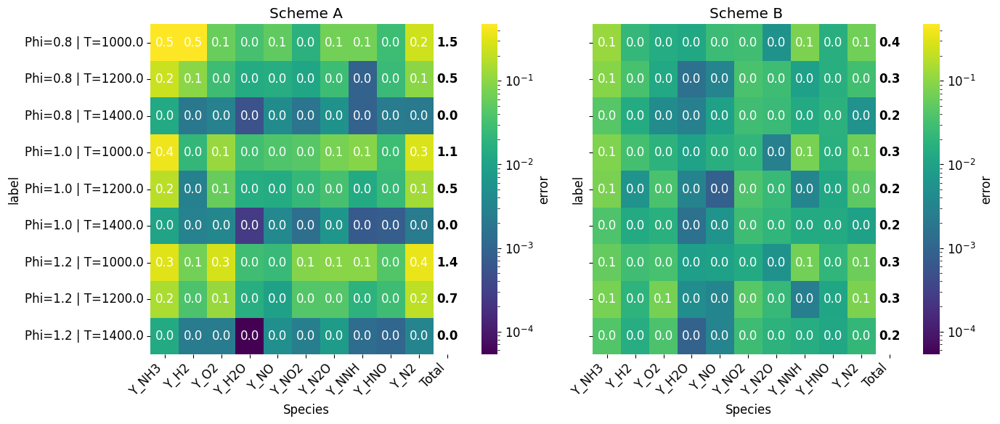

In [35]:
Err_A = RE_A(Ref, A, input_fitness, True, True, "minmax")
Err_B = RE_A(Ref, B, input_fitness, True, True, "minmax")

# Erreurs normalisées (pourcentage du total)
Err_A_Ratio = Err_A.copy()
Err_A_Ratio[input_fitness] = Err_A[input_fitness] 

Err_B_Ratio = Err_B.copy()
Err_B_Ratio[input_fitness] = Err_B[input_fitness] 

# Ajout du label (Phi, T)
Err_A_Ratio["Total"] = Err_A[input_fitness].sum(axis=1)
Err_A_Ratio["label"] = Err_A_Ratio.apply(lambda r: f"Phi={r['Phi_Init']} | T={r['T_Init']}", axis=1)
Err_B_Ratio["Total"] = Err_B[input_fitness].sum(axis=1)
Err_B_Ratio["label"] = Err_B_Ratio.apply(lambda r: f"Phi={r['Phi_Init']} | T={r['T_Init']}", axis=1)



# Matrices à tracer
heatmap_A = Err_A_Ratio.set_index("label")[input_fitness+["Total"]]
heatmap_B = Err_B_Ratio.set_index("label")[input_fitness+["Total"]]
# Création du masque : enlève juste la couleur pour Total
mask_A = np.zeros_like(heatmap_A, dtype=bool)
mask_A[:, heatmap_A.columns.get_loc("Total")] = True
mask_B = np.zeros_like(heatmap_B, dtype=bool)
mask_B[:, heatmap_B.columns.get_loc("Total")] = True

vmin = min(
    heatmap_A.drop(columns="Total").min().min(),
    heatmap_B.drop(columns="Total").min().min()
)

vmax = max(
    heatmap_A.drop(columns="Total").max().max(),
    heatmap_B.drop(columns="Total").max().max()
)



fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharey=True)

# ===== Heatmap A =====
sns.heatmap(
    heatmap_A,
    ax=axes[0],
    fmt=".1f",
    annot=False,      # <- on va annoter manuellement ensuite
    cmap="viridis",
    mask=mask_A,
    cbar_kws={'label': 'error'},
    norm=LogNorm(vmin=vmin, vmax=vmax)
)
axes[0].set_title("Scheme A")
axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=45, ha='right')

# On annote toutes les espèces sauf Total (couleur)
for i in range(heatmap_A.shape[0]):
    for j, col in enumerate(heatmap_A.columns[:-1]):  # sauf dernière colonne
        axes[0].text(j + 0.5, i + 0.5, f"{heatmap_A.iloc[i, j]:.1f}",
                     ha='center', va='center', color='white')

# On annote manuellement TOTAL (sans couleur)
j_total = heatmap_A.columns.get_loc("Total")
for i in range(heatmap_A.shape[0]):
    axes[0].text(j_total + 0.5, i + 0.5,
                 f"{heatmap_A.iloc[i, j_total]:.1f}",
                 ha='center', va='center', color='black', fontweight='bold')

# ===== Heatmap B =====
sns.heatmap(
    heatmap_B,
    ax=axes[1],
    fmt=".1f",
    annot=False,
    cmap="viridis",
    mask=mask_B,
    cbar_kws={'label': 'error'},
    norm=LogNorm(vmin=vmin, vmax=vmax)
)
axes[1].set_title("Scheme B ")
axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=45, ha='right')

# Annot espèce
for i in range(heatmap_B.shape[0]):
    for j, col in enumerate(heatmap_B.columns[:-1]):
        axes[1].text(j + 0.5, i + 0.5, f"{heatmap_B.iloc[i, j]:.1f}",
                     ha='center', va='center', color='white')

# Annot TOTAL
j_total = heatmap_B.columns.get_loc("Total")
for i in range(heatmap_B.shape[0]):
    axes[1].text(j_total + 0.5, i + 0.5,
                 f"{heatmap_B.iloc[i, j_total]:.1f}",
                 ha='center', va='center', color='black', fontweight='bold')

plt.tight_layout()
plt.show()


In [8]:
from matplotlib.colors import rgb2hex

# Générer une palette divergente (liste de 5 couleurs)
palette = sns.diverging_palette(200, 20, center="light", n=5, as_cmap=False)

# Convertir chaque couleur RGB en hex
hex_colors = [rgb2hex(c) for c in palette]

print(hex_colors)

['#3e8186', '#96babd', '#f2f1f1', '#daa294', '#c3553a']


In [9]:
Ratio_df

Species,Y_NH3,Y_H2,Y_O2,Y_H2O,Y_NO,Y_NO2,Y_N2O,Y_NNH,Y_HNO,Y_N2
$ABS^{mm}$,3.052675,1.771300,3.115778,3.177153,1.468577,0.866638,1.427701,0.623509,1.220065,2.898612
$\widehat{ABS}^{mm}$,2.736985,2.079678,2.499699,2.193727,1.349181,0.751846,1.631874,1.156305,1.695523,2.909759
$RMSE^{mm}$,1.850638,1.311319,1.893867,1.958787,1.214146,0.910706,0.977946,0.583384,0.921207,1.871602
$\widehat{RE_A}^{mm}$,2.860603,3.833007,2.718683,3.052911,2.117649,0.866860,2.332047,1.034667,1.284146,3.381788


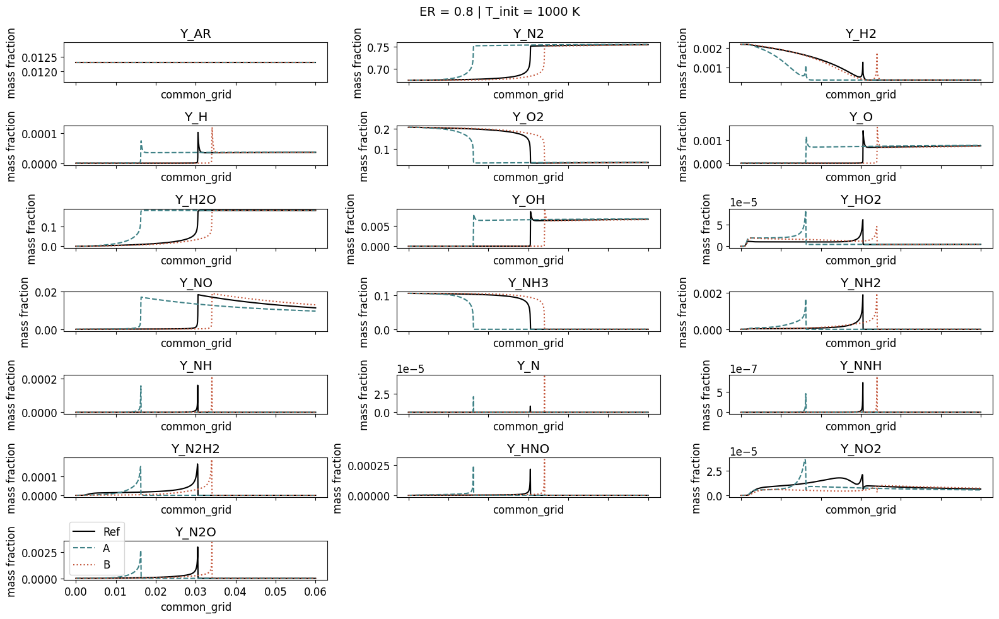

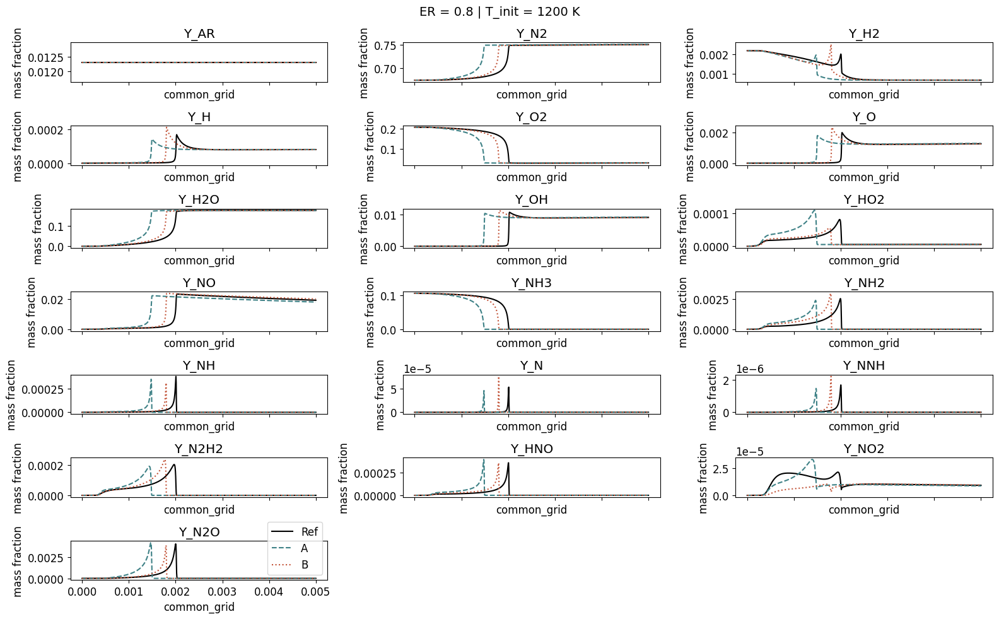

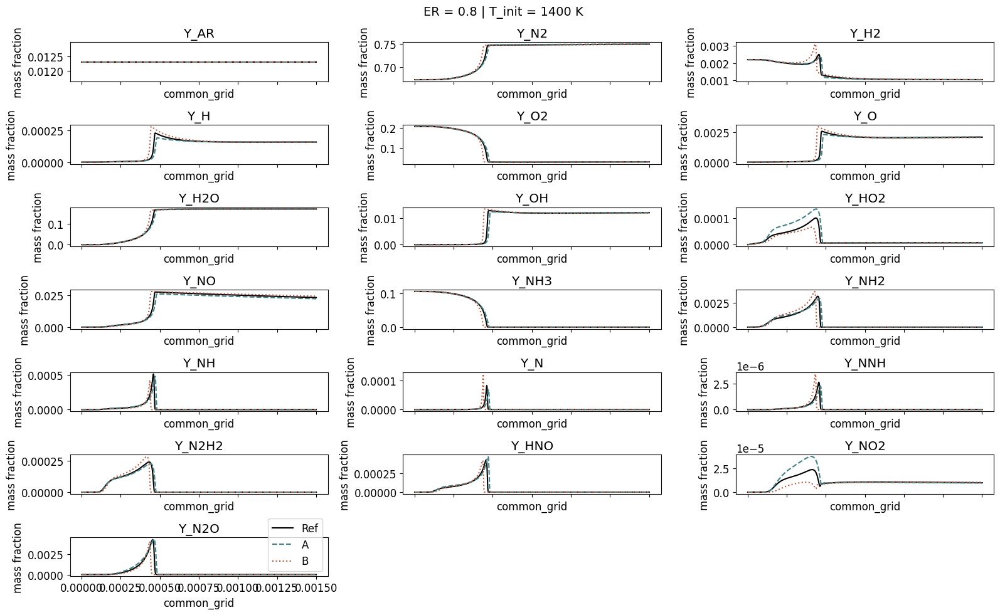

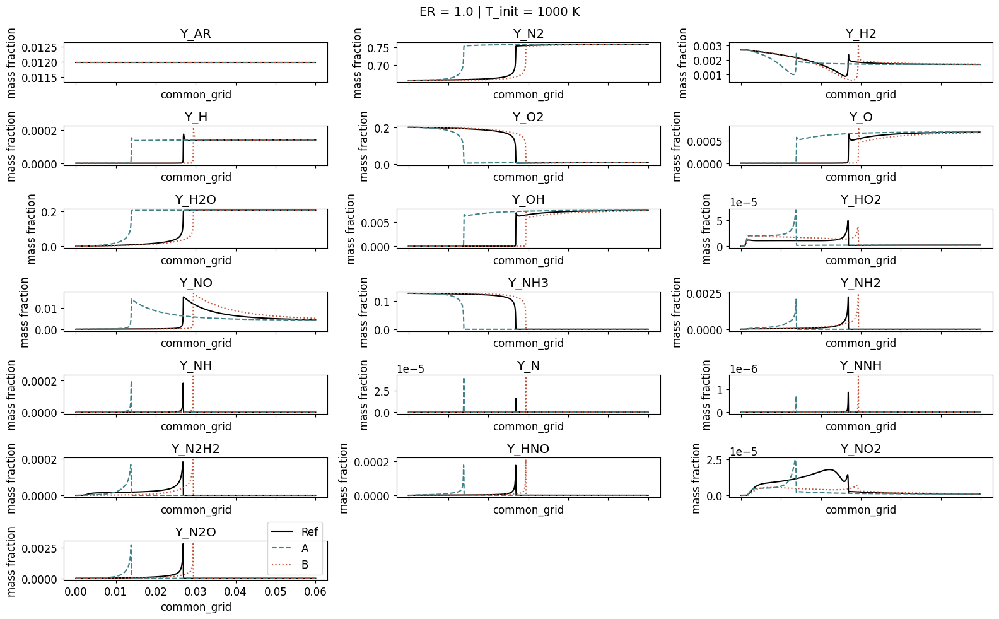

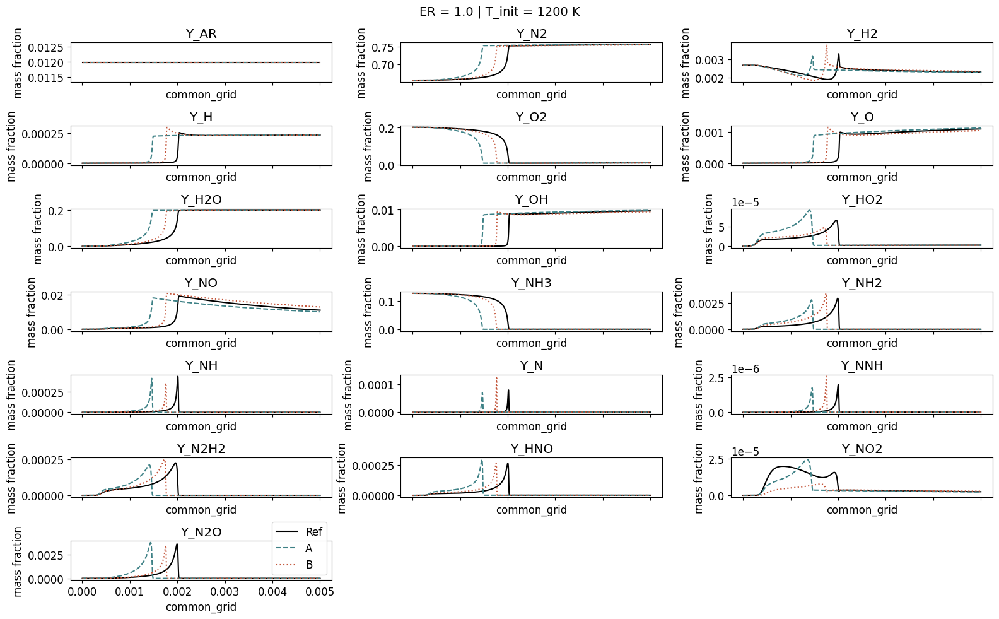

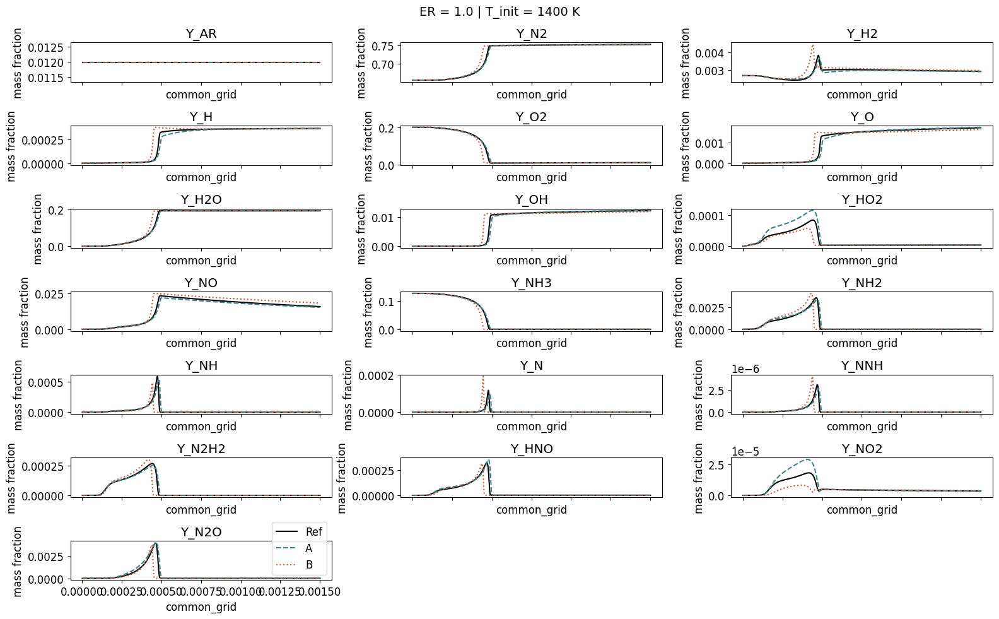

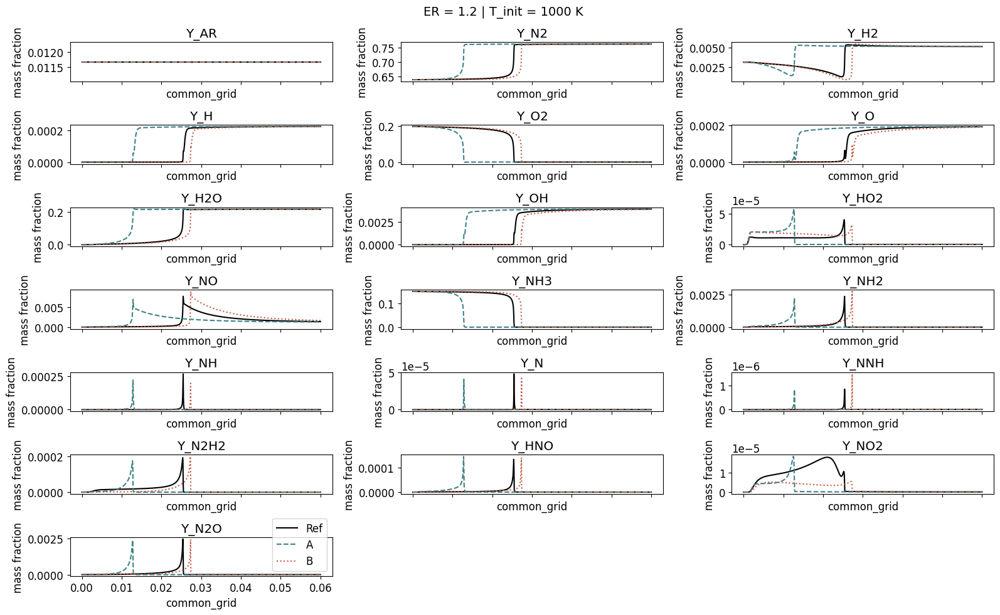

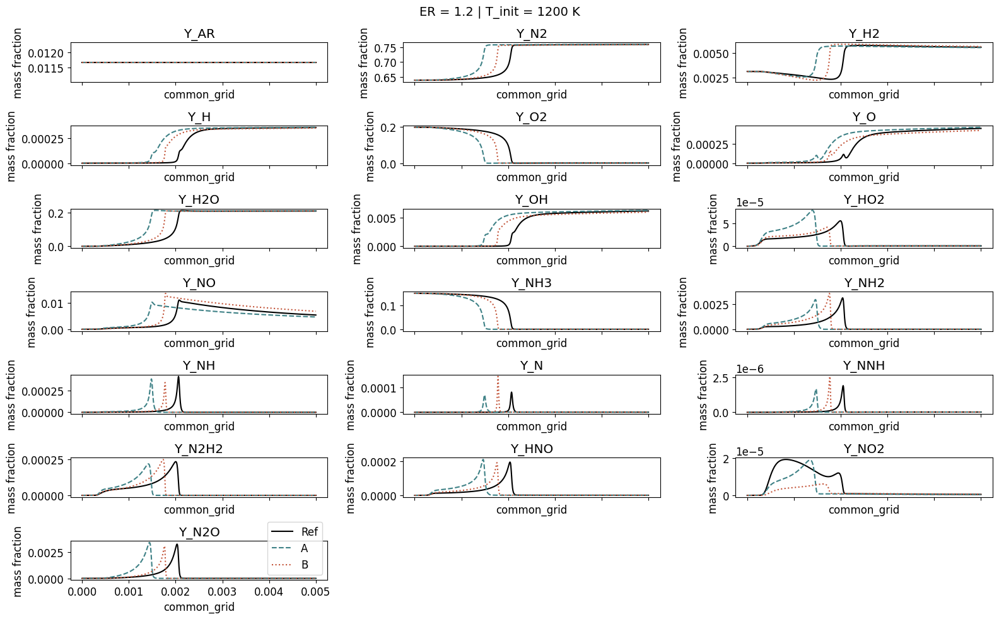

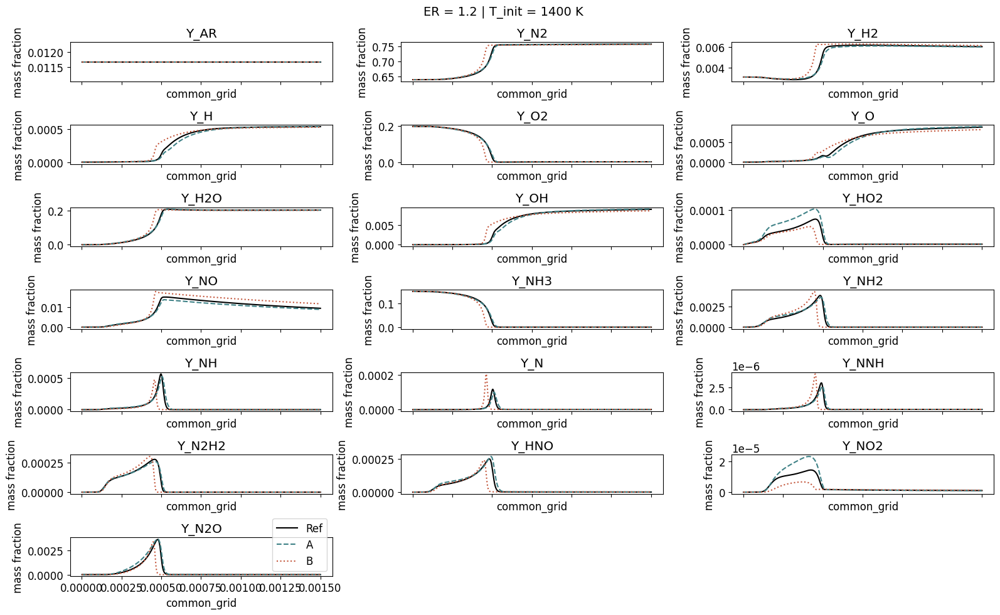

In [11]:
Phi_init = Ref["Phi_Init"].unique() 
T_init = Ref["T_Init"].unique()
input_fitness = [col for col in A.columns if col.startswith("Y_")]
for ER in Phi_init:
    for T in T_init:
        loc_ref = Ref[(Ref["Phi_Init"] == ER) & (Ref["T_Init"] == T)]
        loc_A = A[(A["Phi_Init"] == ER) & (A["T_Init"] == T)]
        loc_B = B[(B["Phi_Init"] == ER) & (B["T_Init"] == T)]

        # Création figure
        fig, axes = plt.subplots(
            nrows=len(input_fitness)//3 + (1 if len(input_fitness) % 3 else 0),
            ncols=3,
            figsize=(16, 10),
            sharex=True
        )
        axes = axes.flatten()

        # Boucle sur les espèces
        for i, sp in enumerate(input_fitness):
            ax = axes[i]
            ax.plot(loc_ref["common_grid"], loc_ref[sp],color="k", label="Ref")
            ax.plot(loc_A["common_grid"], loc_A[sp], linestyle='--',color = "#3e8186", label="A")
            ax.plot(loc_B["common_grid"], loc_B[sp], linestyle=':', color ="#c3553a",label=f"B")

            ax.set_title(sp)
            ax.set_xlabel("common_grid")
            ax.set_ylabel("mass fraction")

        # On retire les axes vides == si nb espèces pas multiple de 3
        for j in range(len(input_fitness), len(axes)):
            fig.delaxes(axes[j])

        fig.suptitle(f"ER = {ER} | T_init = {T} K", fontsize=14)
        plt.tight_layout()
        plt.legend()
        name =f"ER_{ER}_T_{T}.png"
        # plt.savefig(f"A_vs_B/{name}")
        plt.show()
